In [1]:
import numpy as np
import pandas as pd
import os
import plotly.express as px
import xgboost as xgb
from sklearn import metrics
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import MinMaxScaler
from sklearn import model_selection
from sklearn.model_selection import StratifiedKFold
import gc
from sklearn.ensemble import ExtraTreesClassifier, AdaBoostClassifier
gc.enable()
import plotly.figure_factory as ff
import seaborn as sns

In [2]:
import matplotlib.pyplot as plt
import warnings 
warnings.filterwarnings('ignore')
plt.rcParams['figure.dpi'] = 300
sns.set_palette(sns.color_palette("Blues_d"))

In [3]:
sns.color_palette("Blues_d")

[(0.5430834294502115, 0.733917723952326, 0.8593156478277586),
 (0.41069332308086637, 0.6512213251313598, 0.8168294245802896),
 (0.2818813276944765, 0.5707599641163655, 0.7754914776368064),
 (0.21341022683583238, 0.48161476355247984, 0.6738280148660771),
 (0.20898116109188775, 0.3886043829296425, 0.5173343585800333),
 (0.20442906574394465, 0.29301038062283735, 0.3564936562860438)]

In [4]:
train = pd.read_csv('train_data.csv')
call = pd.read_csv('call_data.csv')

In [5]:
train.shape

(450000, 20)

In [6]:
call.shape

(562624, 5)

In [7]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 450000 entries, 0 to 449999
Data columns (total 20 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_time            450000 non-null  object 
 1   order_id              450000 non-null  int64  
 2   order_date            450000 non-null  object 
 3   allot_time            450000 non-null  object 
 4   accept_time           449843 non-null  object 
 5   pickup_time           447579 non-null  object 
 6   delivered_time        444782 non-null  object 
 7   rider_id              450000 non-null  int64  
 8   first_mile_distance   450000 non-null  float64
 9   last_mile_distance    450000 non-null  float64
 10  alloted_orders        433052 non-null  float64
 11  delivered_orders      432659 non-null  float64
 12  cancelled             450000 non-null  int64  
 13  undelivered_orders    432659 non-null  float64
 14  lifetime_order_count  449947 non-null  float64
 15  

In [8]:
call.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 562624 entries, 0 to 562623
Data columns (total 5 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   Unnamed: 0   562624 non-null  int64 
 1   order_id     562624 non-null  int64 
 2   reason_text  37061 non-null   object
 3   user_type    562624 non-null  object
 4   rider_id     562624 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 21.5+ MB


In [9]:
train.head()

,order_time,order_id,order_date,allot_time,accept_time,pickup_time,delivered_time,rider_id,first_mile_distance,last_mile_distance,alloted_orders,delivered_orders,cancelled,undelivered_orders,lifetime_order_count,reassignment_method,reassignment_reason,reassigned_order,session_time,cancelled_time
0,2021-01-26 02:21:35,556753,2021-01-26 00:00:00,2021-01-26 02:21:59,2021-01-26 02:22:08,2021-01-26 02:32:51,2021-01-26 02:49:47,11696,1.5666,2.65,46.0,46.0,0,0.0,621.0,NaN,NaN,NaN,NaN,NaN
1,2021-01-26 02:33:16,556754,2021-01-26 00:00:00,2021-01-26 02:33:57,2021-01-26 02:34:45,2021-01-26 02:50:25,2021-01-26 03:11:15,18117,2.5207,2.76,8.0,8.0,0,0.0,105.0,NaN,NaN,NaN,3.266667,NaN
2,2021-01-26 02:39:49,556755,2021-01-26 00:00:00,2021-01-26 02:39:57,2021-01-26 02:40:13,2021-01-26 02:56:00,2021-01-26 03:12:46,18623,2.2074,4.80,1.0,1.0,0,0.0,66.0,NaN,NaN,NaN,9.816667,NaN
3,2021-01-26 02:47:53,556756,2021-01-26 00:00:00,2021-01-26 02:48:25,2021-01-26 02:49:06,2021-01-26 03:21:51,2021-01-26 03:41:05,15945,2.1894,6.38,1.0,1.0,0,0.0,127.0,NaN,NaN,NaN,17.533333,NaN
4,2021-01-26 03:06:30,556757,2021-01-26 00:00:00,2021-01-26 03:07:21,2021-01-26 03:07:57,2021-01-26 03:31:38,2021-01-26 04:00:15,17589,2.7870,4.01,34.0,34.0,0,0.0,84.0,NaN,NaN,NaN,1.350000,NaN


In [10]:
call.head()

,Unnamed: 0,order_id,reason_text,user_type,rider_id
0,0,556753,NaN,customer,11696
1,1,556753,NaN,customer,11696
2,2,556754,NaN,customer,18117
3,3,556755,NaN,customer,18623
4,4,556755,NaN,customer,18623


In [11]:
train.duplicated().sum()

1

In [12]:
train.cancelled.value_counts()

0    444782
1      5218
Name: cancelled, dtype: int64

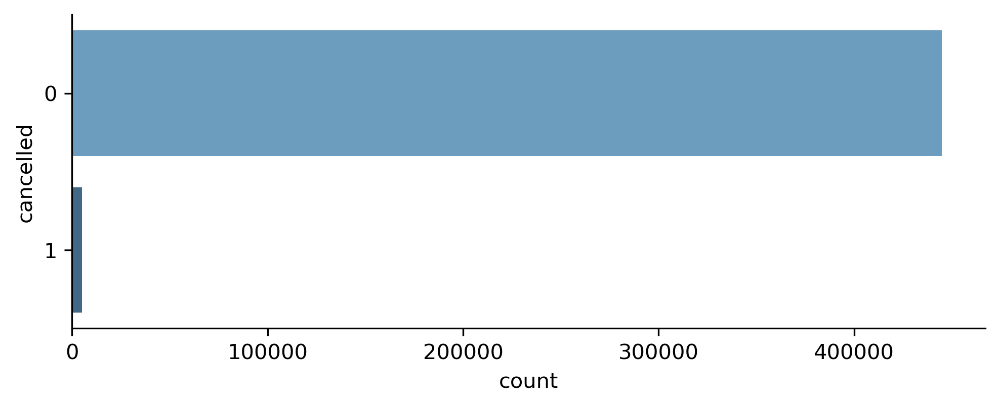

In [13]:
ax = sns.catplot(y="cancelled", kind="count", data=train, height=2.6, aspect=2.5, orient='h',  palette='Blues_d')

In [14]:
def parse_dates(train):
    train['order_time'] = pd.to_datetime(train['order_time'], format = "%Y-%m-%d %X")
    train['order_date'] = pd.to_datetime(train['order_date'], format = "%Y-%m-%d %X")
    train['allot_time'] = pd.to_datetime(train['allot_time'], format = "%Y-%m-%d %X")
    train['accept_time'] = pd.to_datetime(train['accept_time'], format = "%Y-%m-%d %X")
    train['pickup_time'] = pd.to_datetime(train['pickup_time'], format = "%Y-%m-%d %X")
    train['delivered_time'] = pd.to_datetime(train['delivered_time'], format = "%Y-%m-%d %X")
    train['cancelled_time'] = pd.to_datetime(train['cancelled_time'], format = "%Y-%m-%d %X")
    
    return train

In [15]:
train = parse_dates(train)

In [16]:
train['total_dist'] = train.first_mile_distance + train.last_mile_distance

In [17]:
train['weekday'] = train.order_date.dt.strftime('%A')

In [18]:
train['weekday_num'] = train.order_date.dt.weekday

In [19]:
train.head()

,order_time,order_id,order_date,allot_time,accept_time,pickup_time,delivered_time,rider_id,first_mile_distance,last_mile_distance,...,undelivered_orders,lifetime_order_count,reassignment_method,reassignment_reason,reassigned_order,session_time,cancelled_time,total_dist,weekday,weekday_num
0,2021-01-26 02:21:35,556753,2021-01-26,2021-01-26 02:21:59,2021-01-26 02:22:08,2021-01-26 02:32:51,2021-01-26 02:49:47,11696,1.5666,2.65,...,0.0,621.0,NaN,NaN,NaN,NaN,NaT,4.2166,Tuesday,1
1,2021-01-26 02:33:16,556754,2021-01-26,2021-01-26 02:33:57,2021-01-26 02:34:45,2021-01-26 02:50:25,2021-01-26 03:11:15,18117,2.5207,2.76,...,0.0,105.0,NaN,NaN,NaN,3.266667,NaT,5.2807,Tuesday,1
2,2021-01-26 02:39:49,556755,2021-01-26,2021-01-26 02:39:57,2021-01-26 02:40:13,2021-01-26 02:56:00,2021-01-26 03:12:46,18623,2.2074,4.80,...,0.0,66.0,NaN,NaN,NaN,9.816667,NaT,7.0074,Tuesday,1
3,2021-01-26 02:47:53,556756,2021-01-26,2021-01-26 02:48:25,2021-01-26 02:49:06,2021-01-26 03:21:51,2021-01-26 03:41:05,15945,2.1894,6.38,...,0.0,127.0,NaN,NaN,NaN,17.533333,NaT,8.5694,Tuesday,1
4,2021-01-26 03:06:30,556757,2021-01-26,2021-01-26 03:07:21,2021-01-26 03:07:57,2021-01-26 03:31:38,2021-01-26 04:00:15,17589,2.7870,4.01,...,0.0,84.0,NaN,NaN,NaN,1.350000,NaT,6.7970,Tuesday,1


In [20]:
px.bar(train['weekday'].value_counts(), title="Weekday distribution of orders", labels={
    'value': 'Count of orders on that day',
    'index': 'Day of the week'
},)

<AxesSubplot:xlabel='weekday', ylabel='count'>

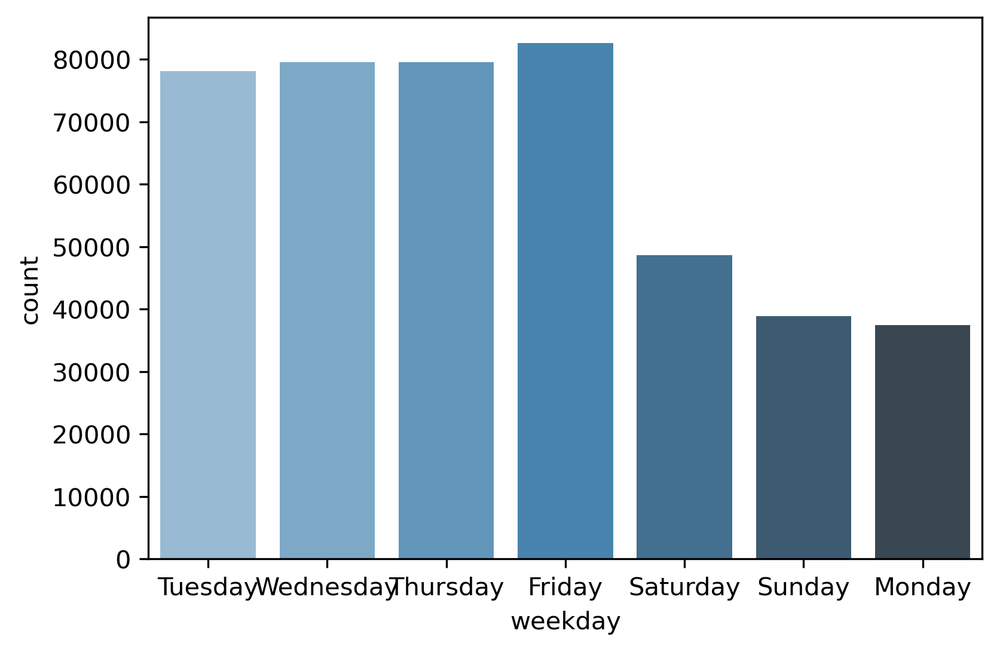

In [20]:
#sns.color_palette()
sns.countplot(train[train.cancelled==0]['weekday'], palette='Blues_d')

<AxesSubplot:xlabel='weekday', ylabel='count'>

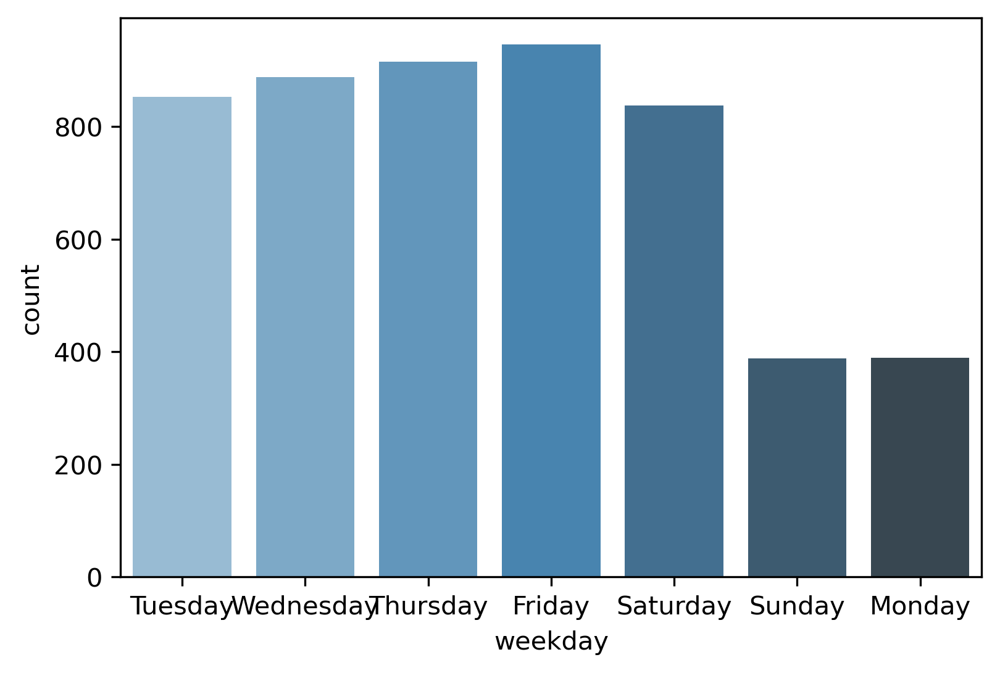

In [21]:
sns.countplot(train[train.cancelled==1]['weekday'], palette='Blues_d')

In [22]:
train.total_dist.mean()

4.198761688468436

<AxesSubplot:xlabel='total_dist'>

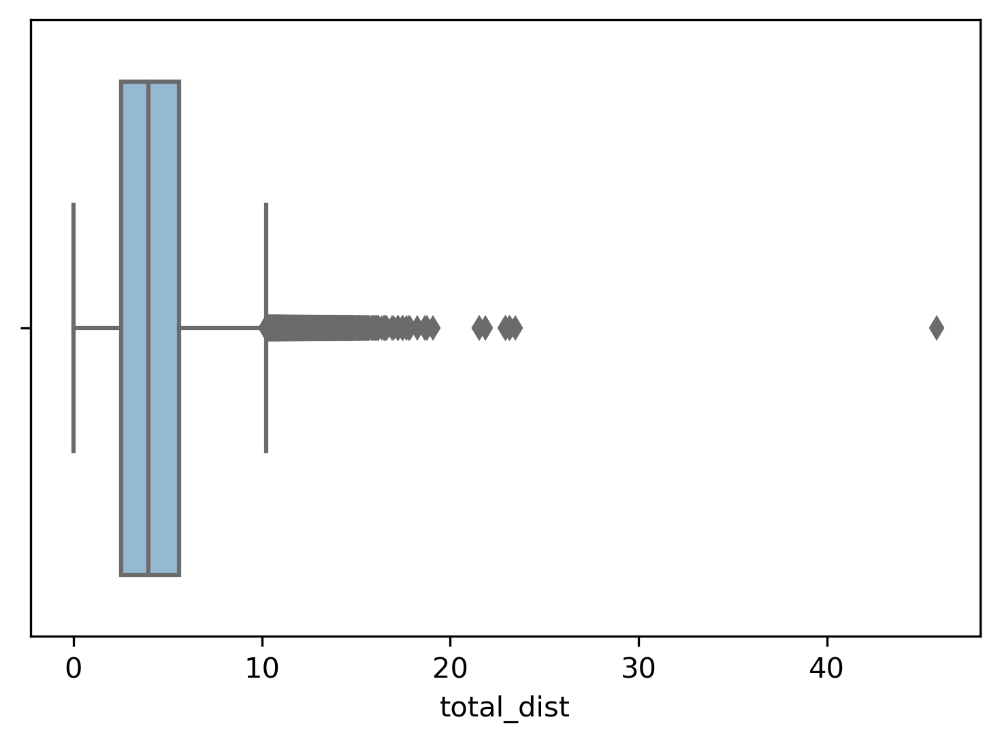

In [23]:
sns.boxplot(train.total_dist)

In [24]:
train['order_time_hour'] = train.order_time.dt.hour

In [25]:
train.head()

,order_time,order_id,order_date,allot_time,accept_time,pickup_time,delivered_time,rider_id,first_mile_distance,last_mile_distance,...,lifetime_order_count,reassignment_method,reassignment_reason,reassigned_order,session_time,cancelled_time,total_dist,weekday,weekday_num,order_time_hour
0,2021-01-26 02:21:35,556753,2021-01-26,2021-01-26 02:21:59,2021-01-26 02:22:08,2021-01-26 02:32:51,2021-01-26 02:49:47,11696,1.5666,2.65,...,621.0,NaN,NaN,NaN,NaN,NaT,4.2166,Tuesday,1,2
1,2021-01-26 02:33:16,556754,2021-01-26,2021-01-26 02:33:57,2021-01-26 02:34:45,2021-01-26 02:50:25,2021-01-26 03:11:15,18117,2.5207,2.76,...,105.0,NaN,NaN,NaN,3.266667,NaT,5.2807,Tuesday,1,2
2,2021-01-26 02:39:49,556755,2021-01-26,2021-01-26 02:39:57,2021-01-26 02:40:13,2021-01-26 02:56:00,2021-01-26 03:12:46,18623,2.2074,4.80,...,66.0,NaN,NaN,NaN,9.816667,NaT,7.0074,Tuesday,1,2
3,2021-01-26 02:47:53,556756,2021-01-26,2021-01-26 02:48:25,2021-01-26 02:49:06,2021-01-26 03:21:51,2021-01-26 03:41:05,15945,2.1894,6.38,...,127.0,NaN,NaN,NaN,17.533333,NaT,8.5694,Tuesday,1,2
4,2021-01-26 03:06:30,556757,2021-01-26,2021-01-26 03:07:21,2021-01-26 03:07:57,2021-01-26 03:31:38,2021-01-26 04:00:15,17589,2.7870,4.01,...,84.0,NaN,NaN,NaN,1.350000,NaT,6.7970,Tuesday,1,3


<AxesSubplot:xlabel='order_time_hour', ylabel='Density'>

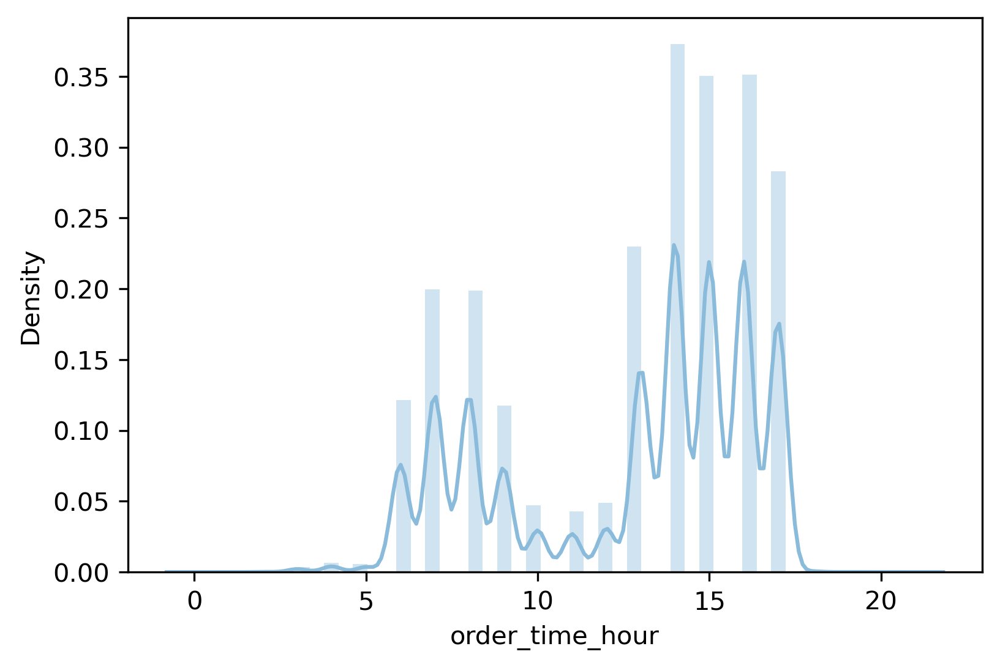

In [26]:
sns.distplot(train[train['cancelled']==0]['order_time_hour'])

<AxesSubplot:xlabel='order_time_hour', ylabel='Density'>

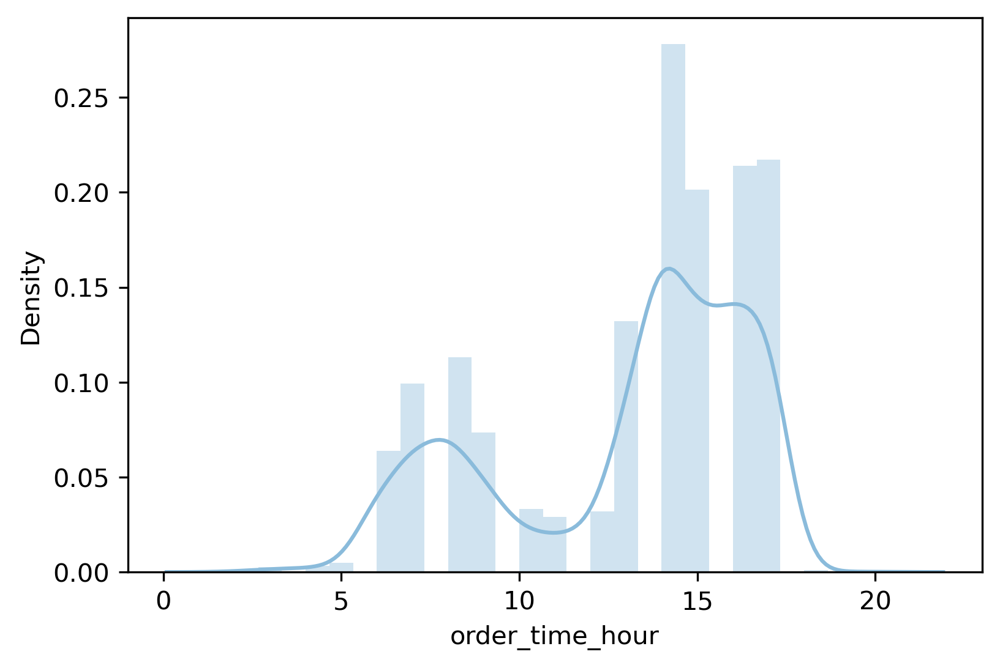

In [27]:
sns.distplot(train[train['cancelled']==1]['order_time_hour'])

In [28]:
train['accept_time_hour'] = train.accept_time.dt.hour

<AxesSubplot:xlabel='accept_time_hour', ylabel='Density'>

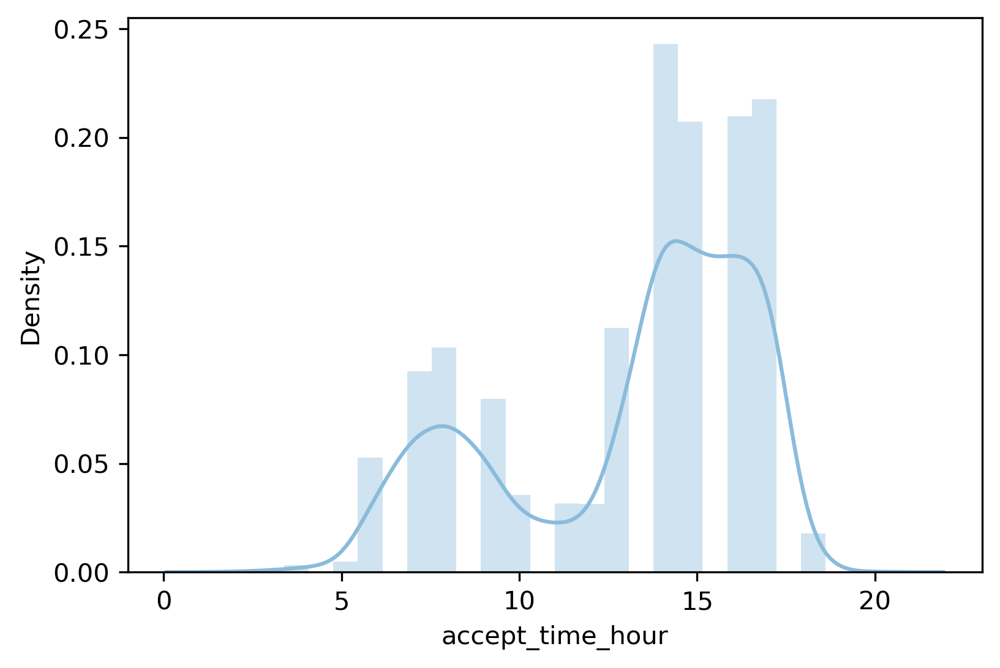

In [29]:
sns.distplot(train[train['cancelled']==1]['accept_time_hour'])

<AxesSubplot:xlabel='accept_time_hour', ylabel='Density'>

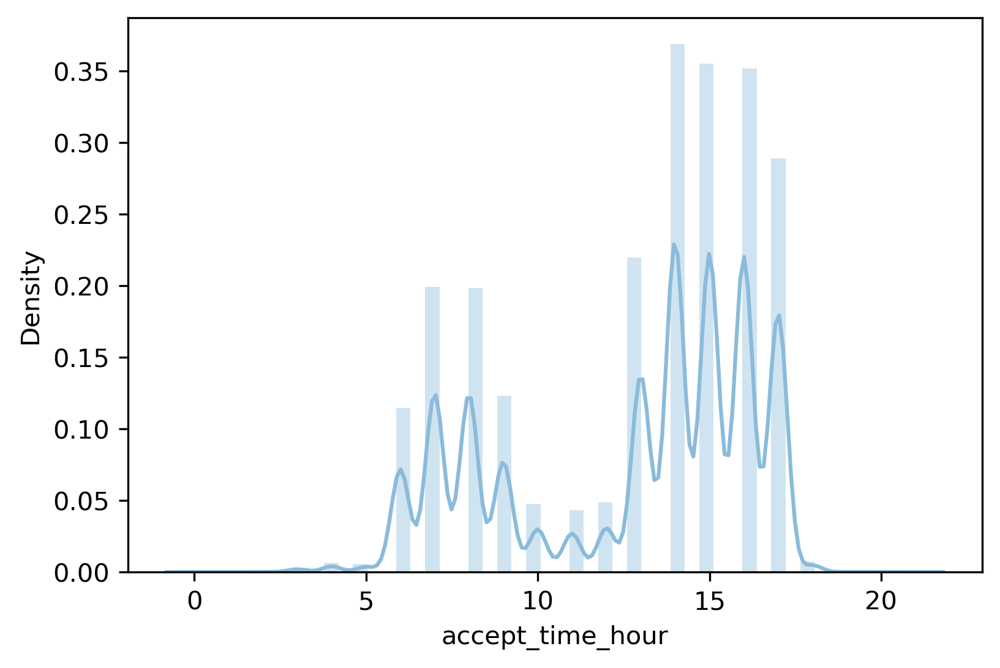

In [30]:
sns.distplot(train['accept_time_hour'])

<AxesSubplot:xlabel='total_dist', ylabel='Density'>

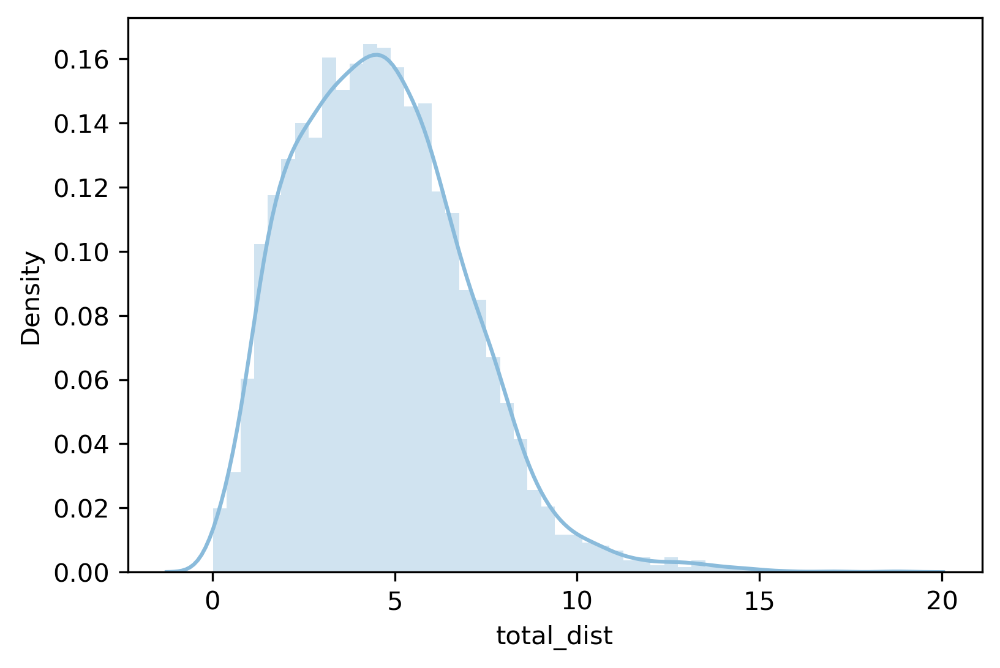

In [31]:
sns.distplot(train[train['cancelled']==1]['total_dist'])

<AxesSubplot:xlabel='total_dist', ylabel='Density'>

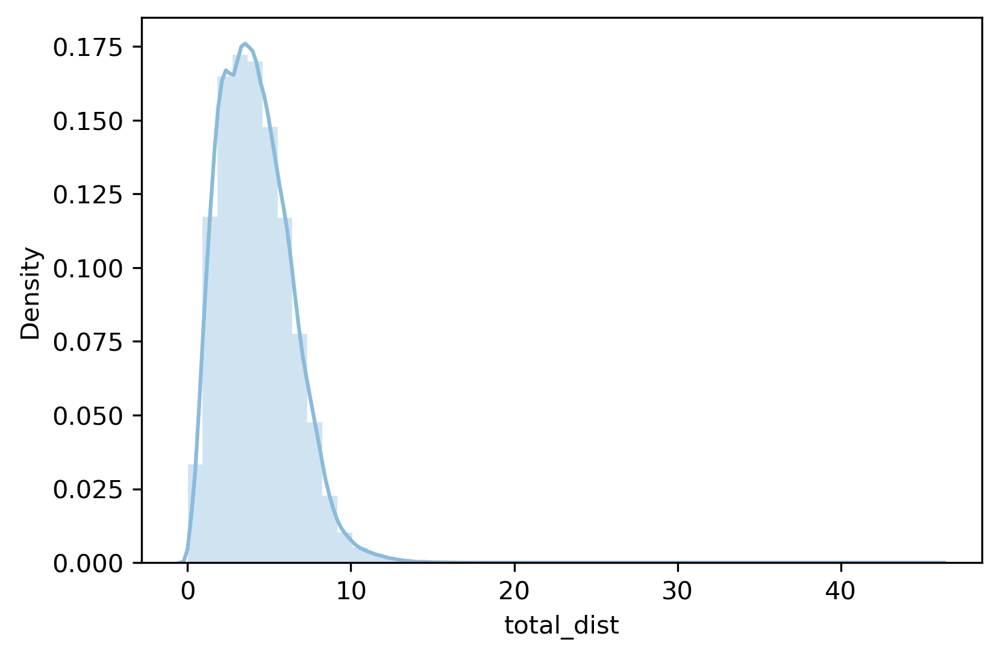

In [32]:
sns.distplot(train[train['cancelled']==0]['total_dist'])

In [33]:
def first_order_set(row):
    if row.lifetime_order_count > 0:
        return 1
    return 0

train['first_order'] = train.apply(first_order_set, axis = 1)

In [34]:
train.delivered_orders = train.delivered_orders.fillna(0)
train.undelivered_orders = train.undelivered_orders.fillna(0)
train.alloted_orders = train.alloted_orders.fillna(0)

<AxesSubplot:xlabel='delivered_orders', ylabel='Density'>

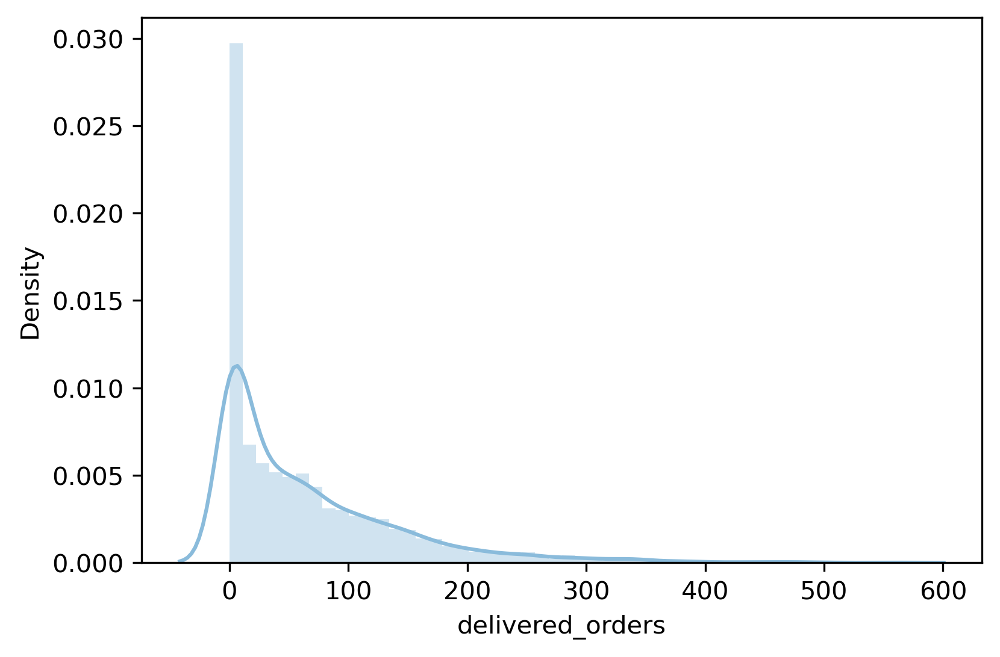

In [35]:
sns.distplot(train[train.cancelled == 1]['delivered_orders'])

<AxesSubplot:xlabel='delivered_orders', ylabel='Density'>

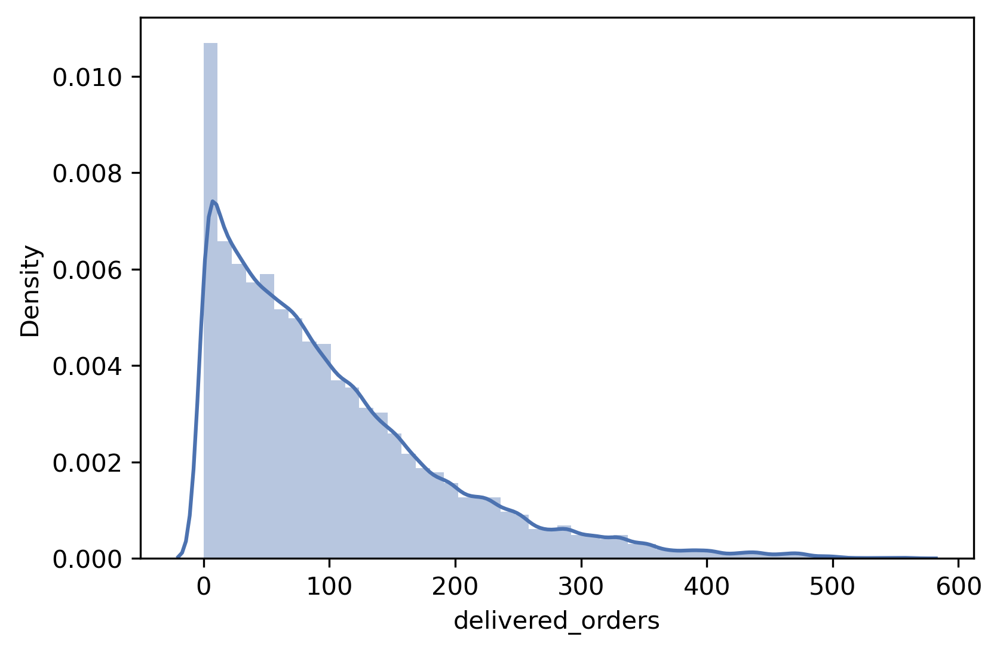

In [287]:
sns.distplot(train[train.cancelled == 0]['delivered_orders'])

In [288]:
train.lifetime_order_count = train.lifetime_order_count.fillna(0)

<AxesSubplot:xlabel='lifetime_order_count', ylabel='Density'>

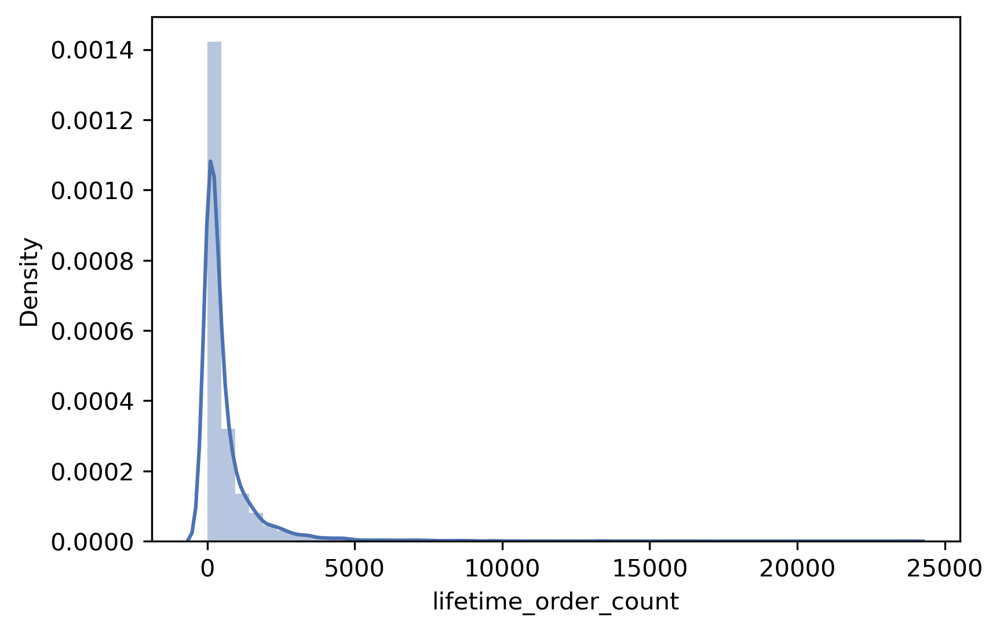

In [289]:
sns.distplot(train[train.cancelled==1]['lifetime_order_count'])

<AxesSubplot:xlabel='lifetime_order_count', ylabel='Density'>

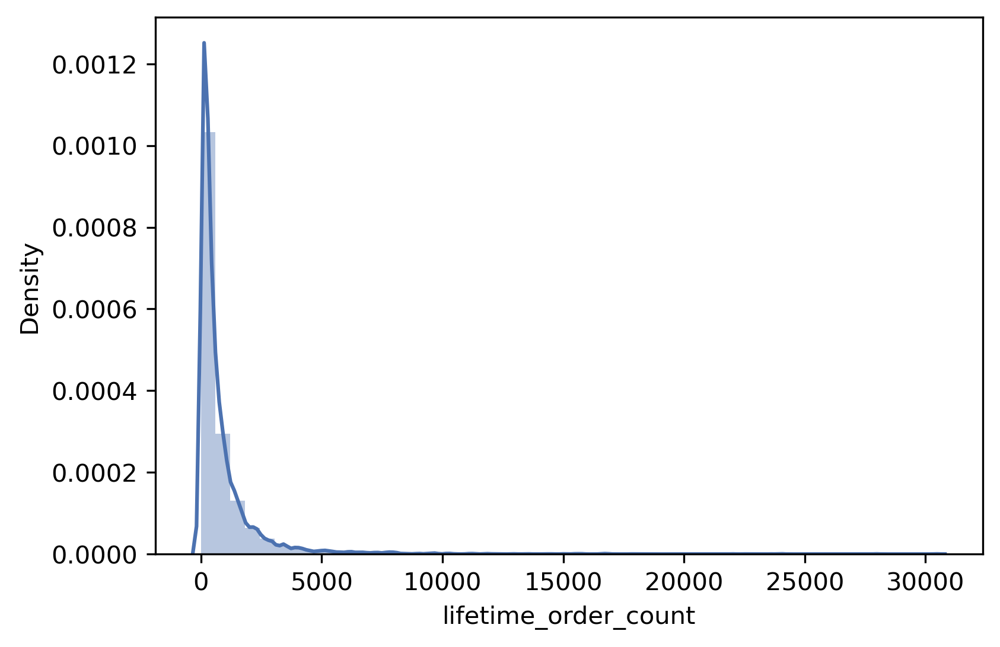

In [290]:
sns.distplot(train[train.cancelled==0]['lifetime_order_count'])

In [36]:
def cancel_before_accept(row):
    if pd.isna(row['accept_time']):
        return 1
    return 0

train['cancel_before_accept'] = train.apply(cancel_before_accept, axis=1)

<AxesSubplot:xlabel='cancel_before_accept', ylabel='count'>

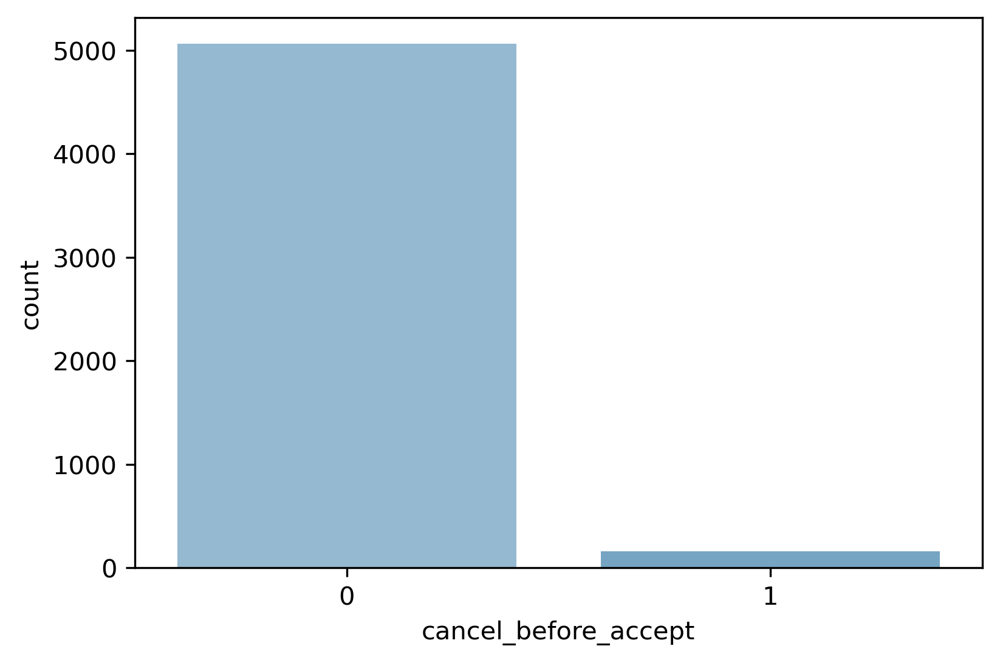

In [37]:
sns.countplot(train[train.cancelled==1]['cancel_before_accept'])

In [38]:
kdeplot('cancel_before_accept')

NameError: name 'kdeplot' is not defined

In [ ]:
sns.boxplot(train.session_time)

In [45]:
train.session_time = train.session_time.fillna(train.session_time.median())

<AxesSubplot:xlabel='session_time', ylabel='Density'>

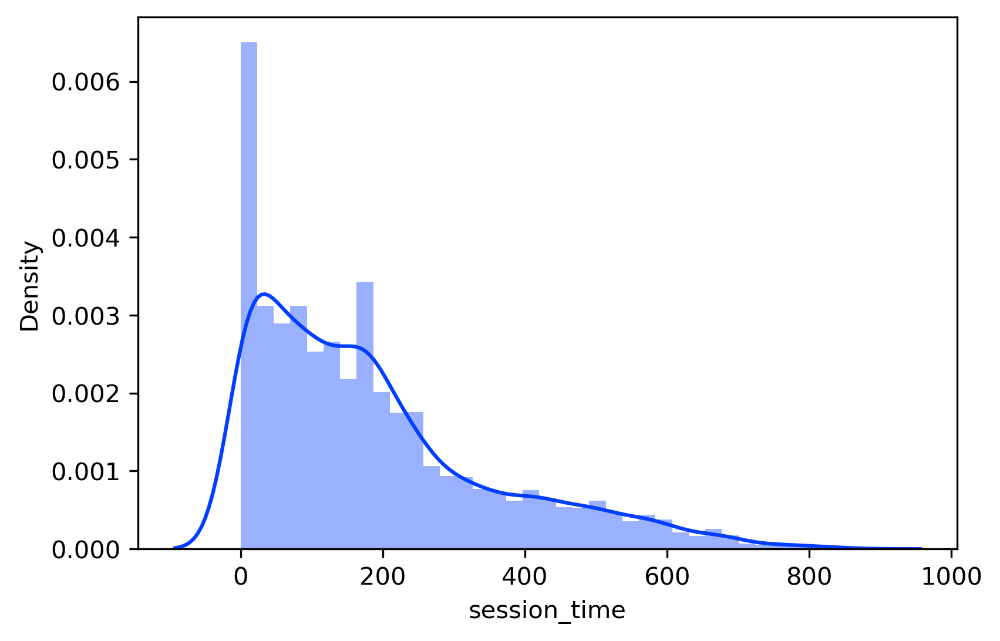

In [47]:
sns.distplot(train[train.cancelled==1]['session_time'])

<AxesSubplot:xlabel='session_time', ylabel='Density'>

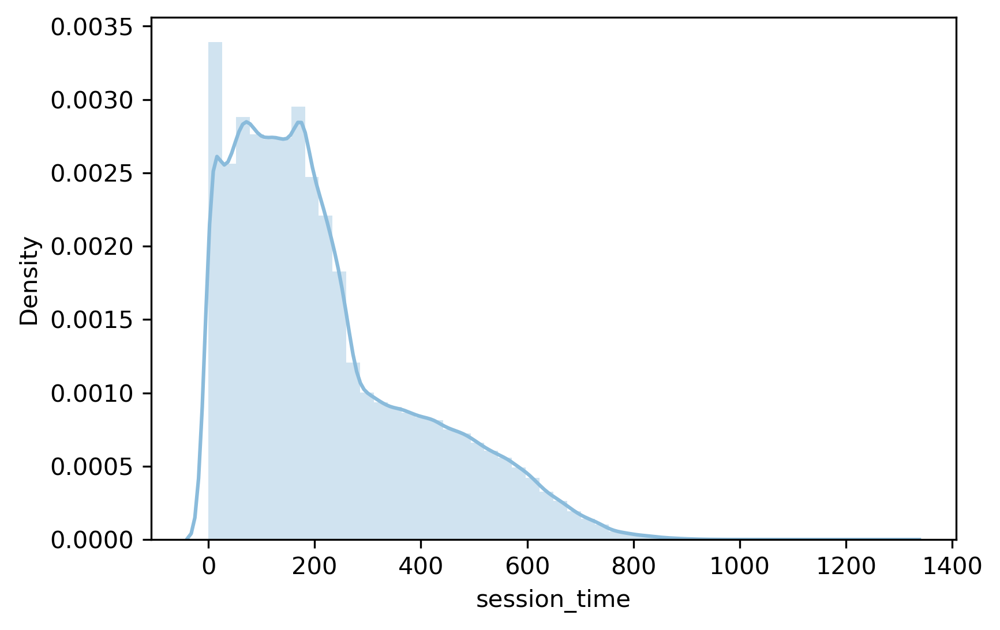

In [331]:
sns.distplot(train[train.cancelled==0]['session_time'])

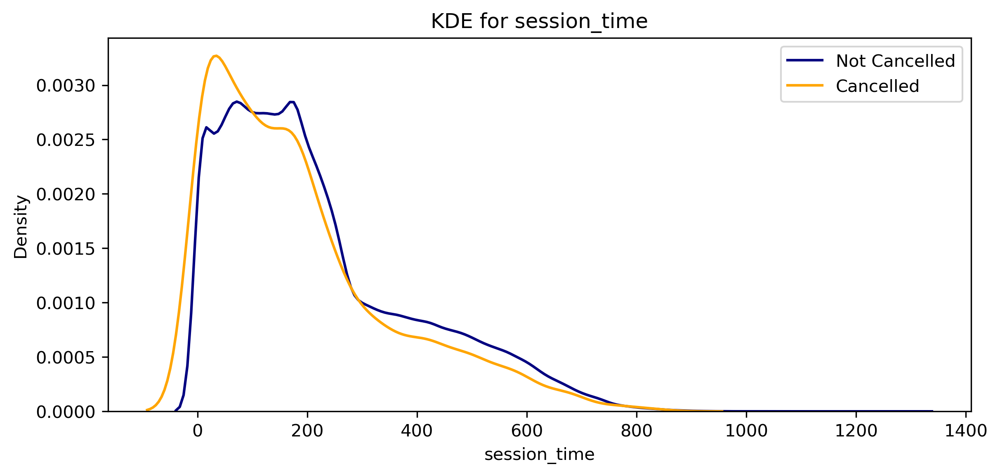

In [332]:
kdeplot('session_time')

In [39]:
train['delivered_fraction'] = train.delivered_orders / train.alloted_orders

<AxesSubplot:xlabel='delivered_fraction', ylabel='Density'>

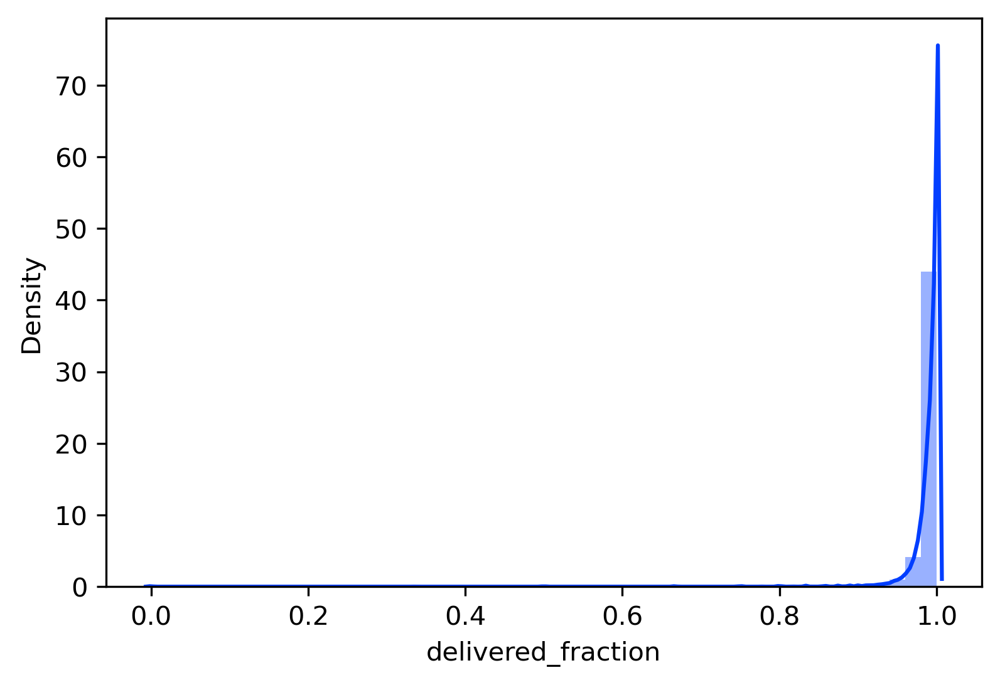

In [50]:
sns.distplot(train[train.cancelled==0]['delivered_fraction'])

<AxesSubplot:xlabel='delivered_fraction', ylabel='Density'>

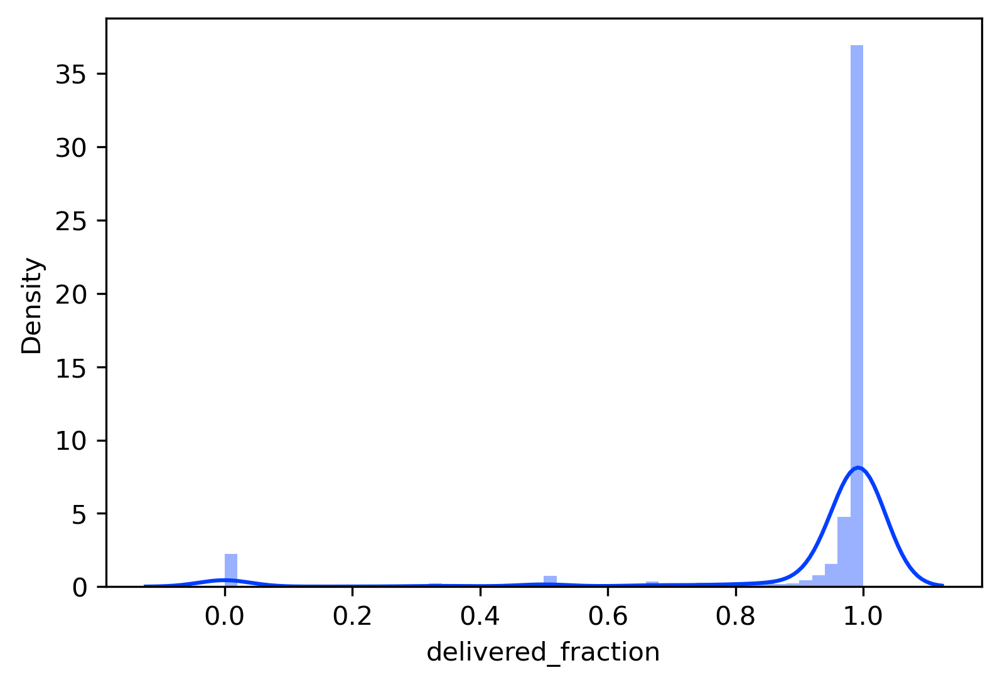

In [51]:
sns.distplot(train[train.cancelled==1]['delivered_fraction'])

<AxesSubplot:>

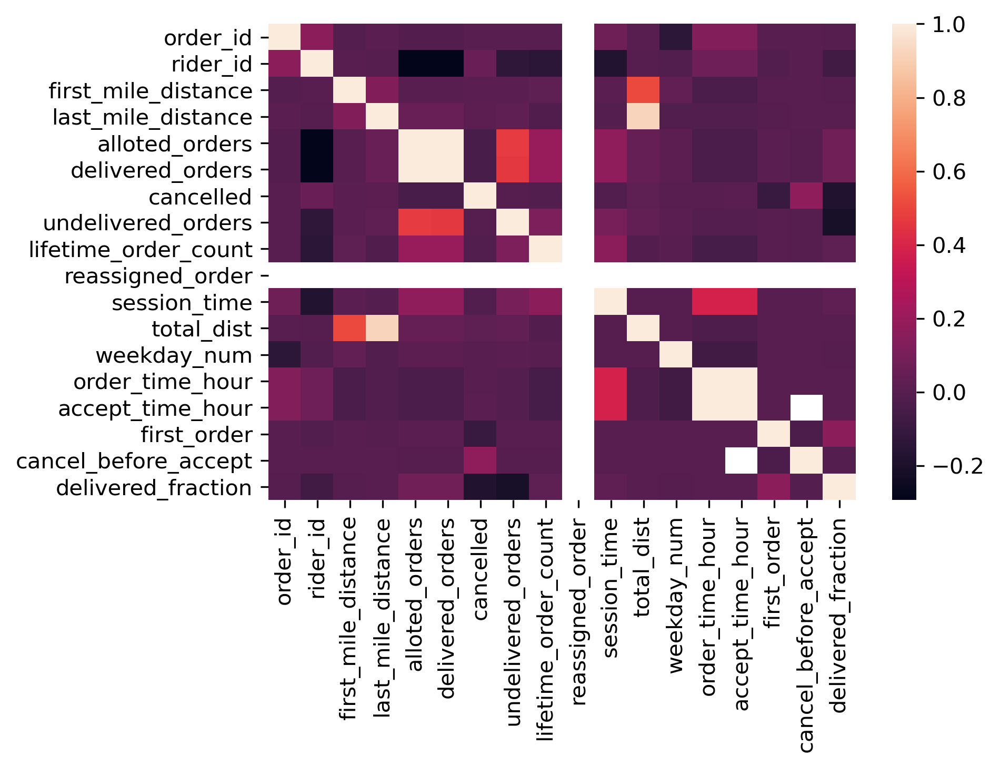

In [41]:
sns.heatmap(train.corr())

In [42]:
px.imshow(train.corr())

<AxesSubplot:xlabel='weekday', ylabel='count'>

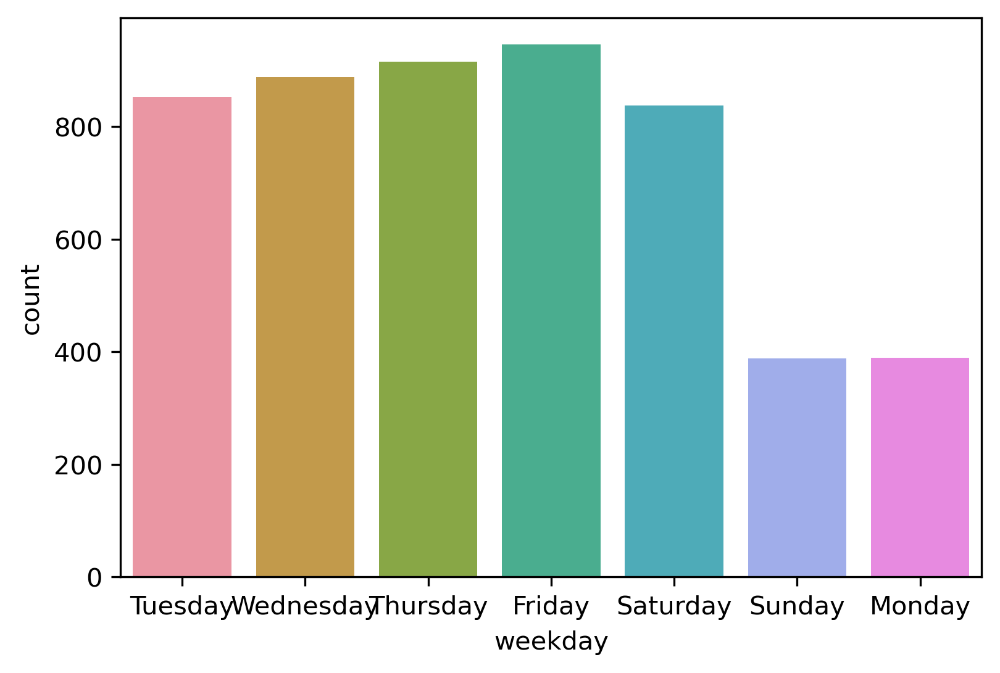

In [297]:
sns.countplot(train[train.cancelled == 1]['weekday'])

<AxesSubplot:xlabel='weekday', ylabel='count'>

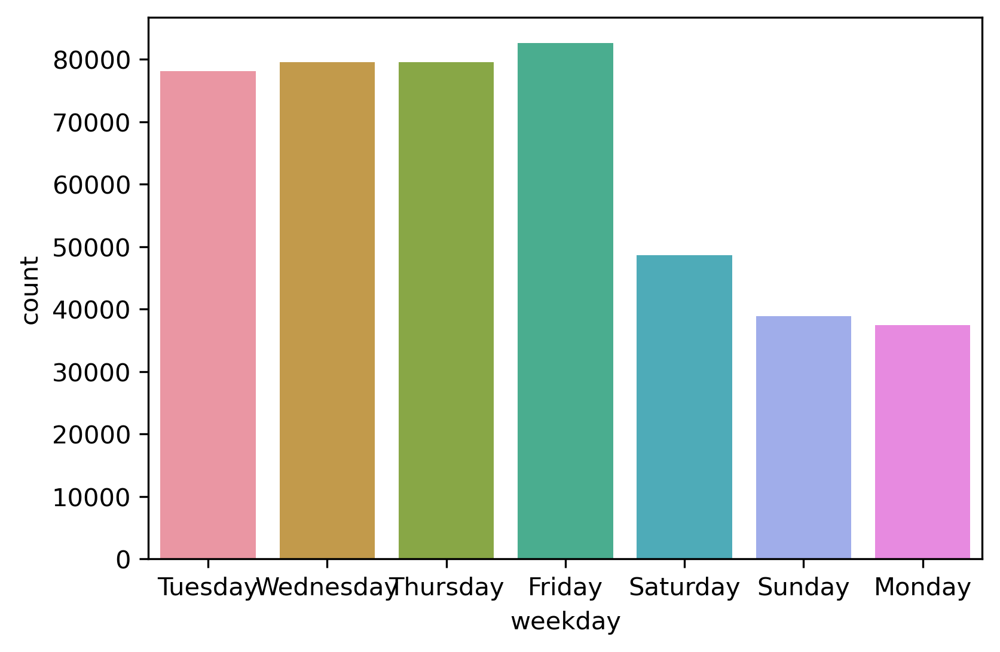

In [298]:
sns.countplot(train[train.cancelled == 0]['weekday'])

In [55]:
train['accept_order_diff'] = (train['accept_time'] - train['order_time']).dt.total_seconds()

<AxesSubplot:xlabel='accept_order_diff', ylabel='Density'>

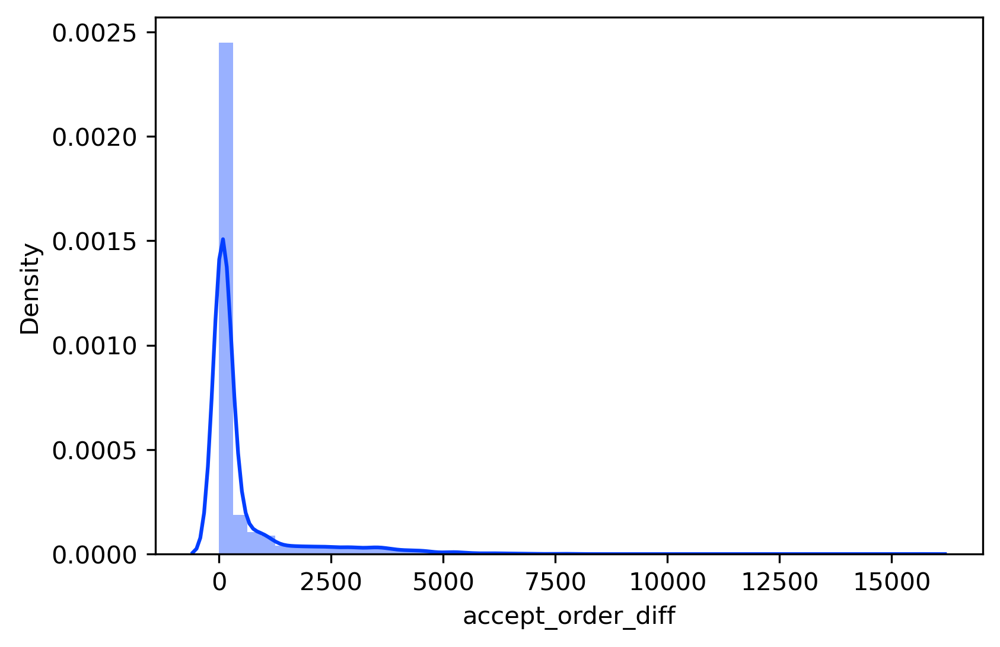

In [56]:
sns.distplot(train[train.cancelled == 1]['accept_order_diff'])

<AxesSubplot:xlabel='accept_order_diff', ylabel='Density'>

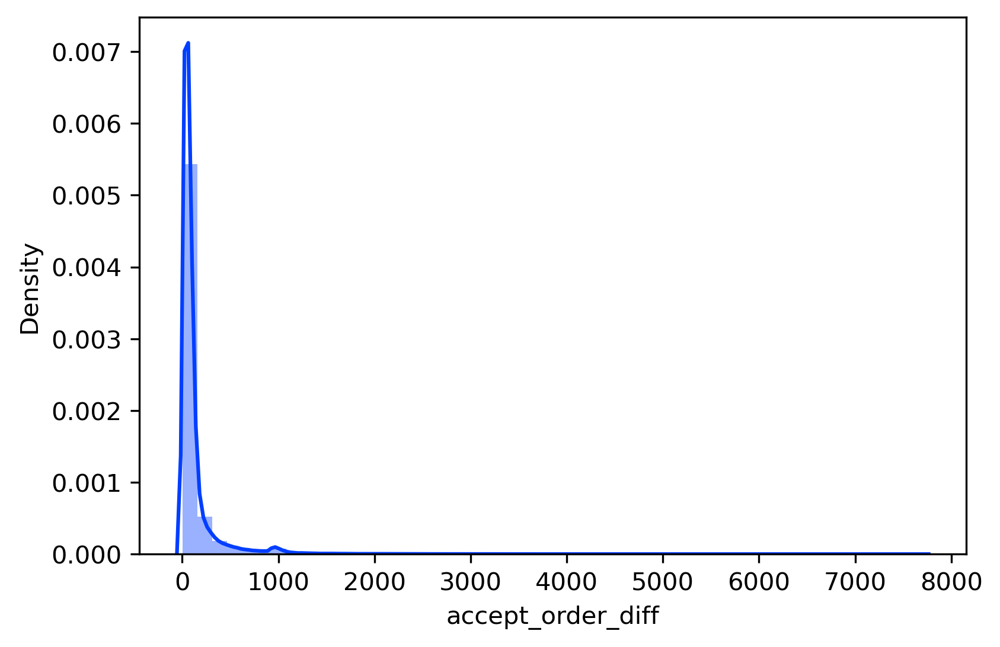

In [57]:
sns.distplot(train[train.cancelled == 0]['accept_order_diff'])

In [63]:
def kdeplot(feature):
    plt.figure(figsize=(9, 4))
    plt.title("KDE for {}".format(feature))
    ax0 = sns.kdeplot(train[train['cancelled'] == 0][feature].dropna(), color= 'navy', label= 'Not Cancelled')
    ax1 = sns.kdeplot(train[train['cancelled'] == 1][feature].dropna(), color= 'orange', label= 'Cancelled')
    plt.legend()

<AxesSubplot:xlabel='order_time_hour', ylabel='Density'>

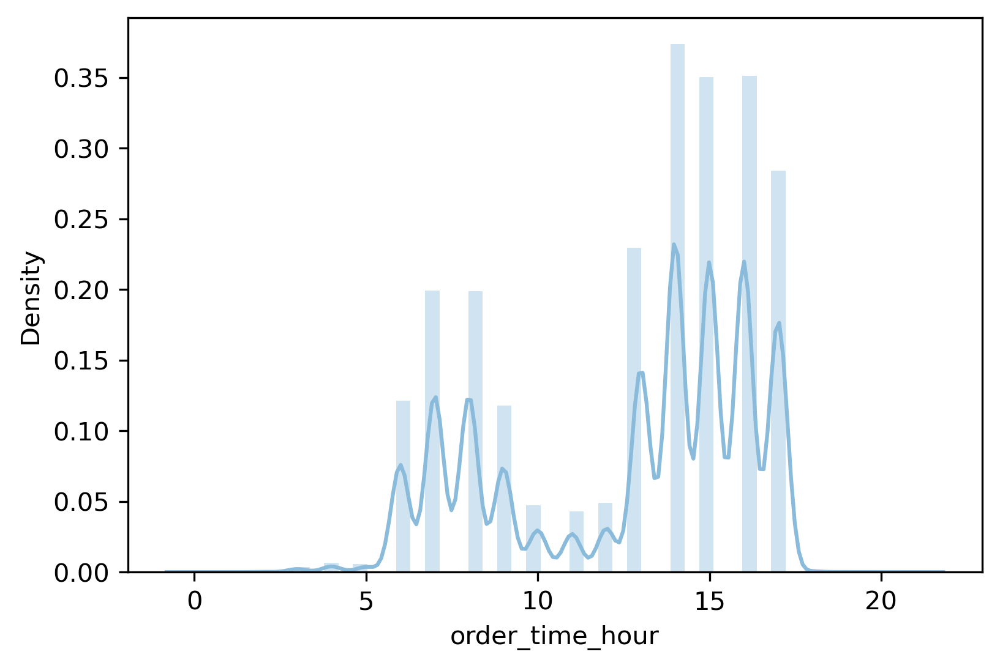

In [327]:
sns.distplot(train.order_time_hour)

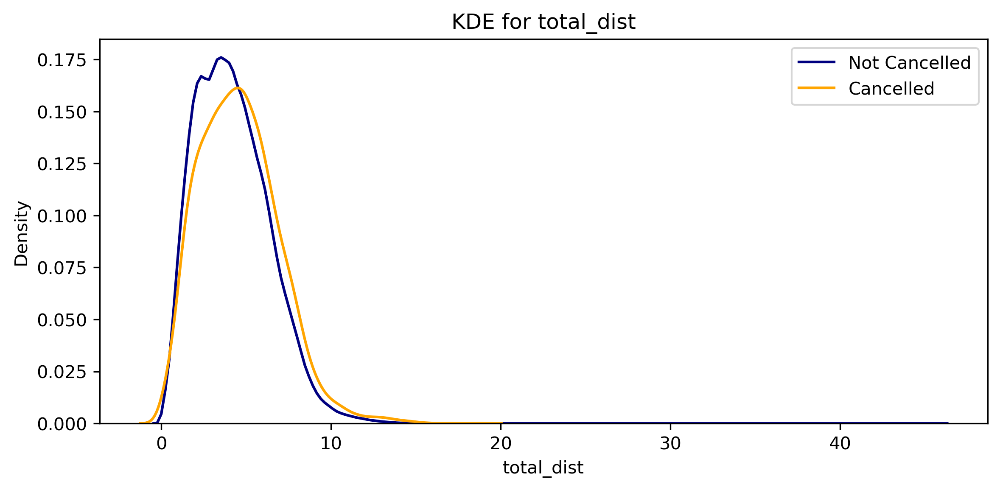

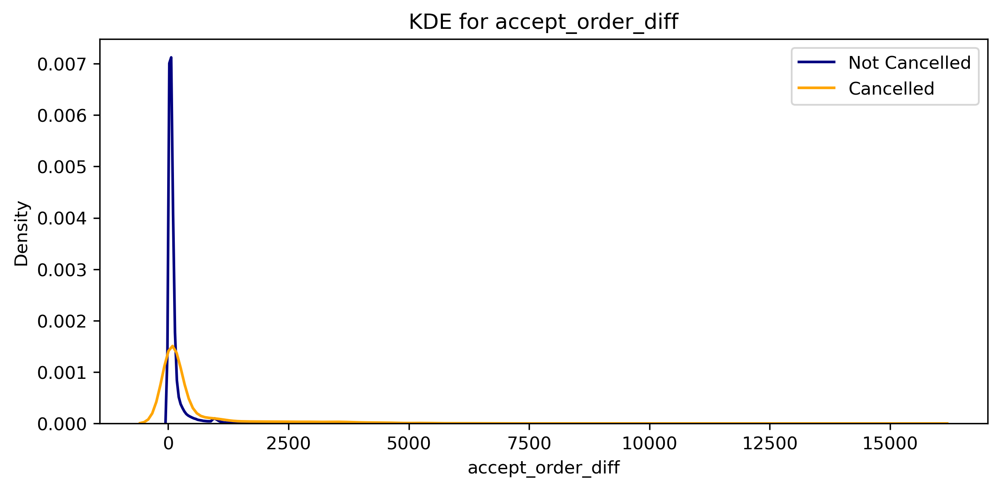

In [64]:
kdeplot('total_dist')
kdeplot('accept_order_diff')

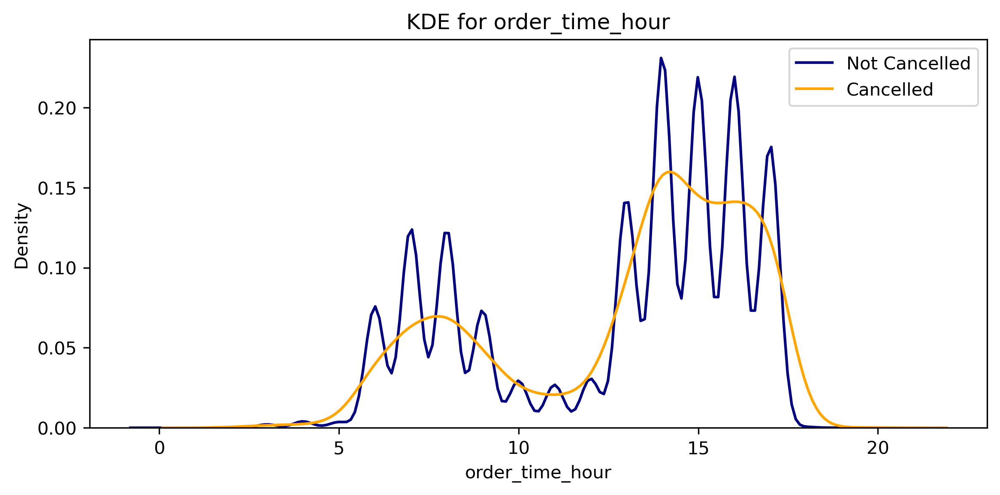

In [129]:
kdeplot('order_time_hour')

In [329]:
train['cancelled_hour'] = train.cancelled_time.dt.hour

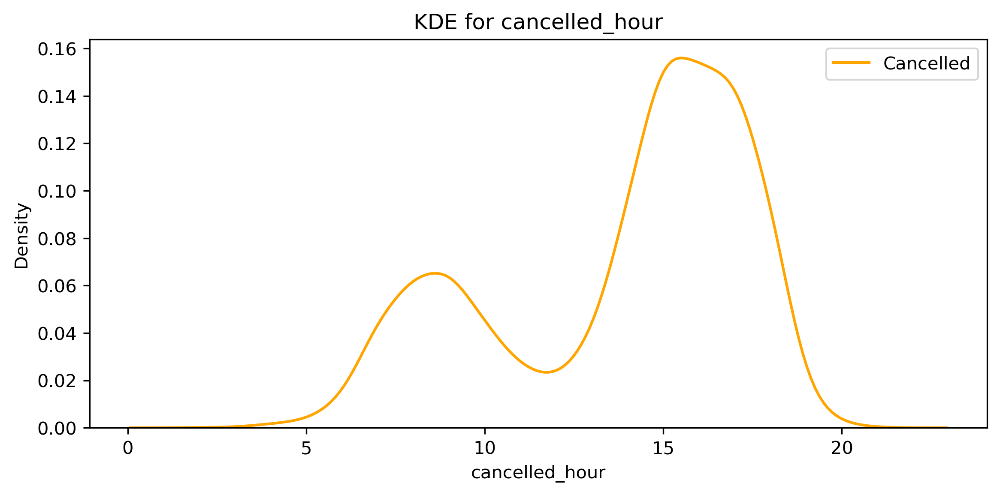

In [330]:
kdeplot('cancelled_hour')

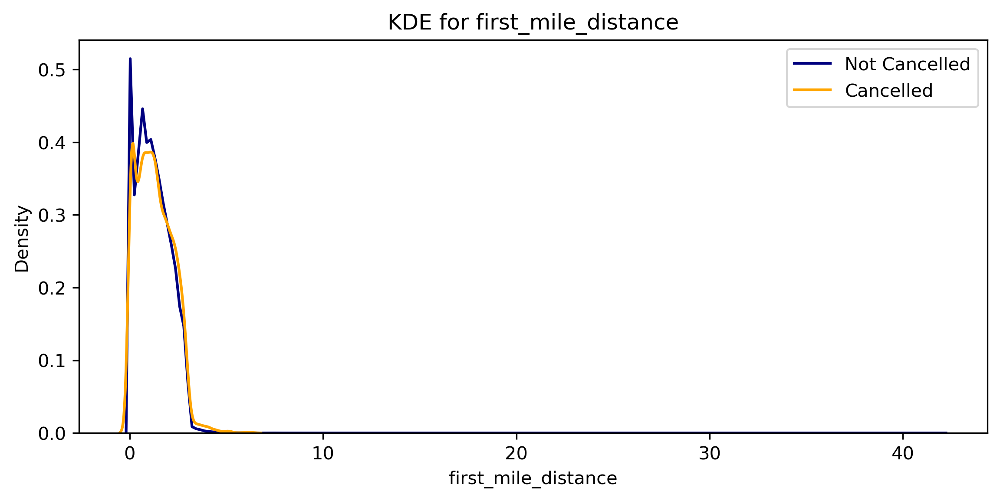

In [65]:
kdeplot('first_mile_distance')

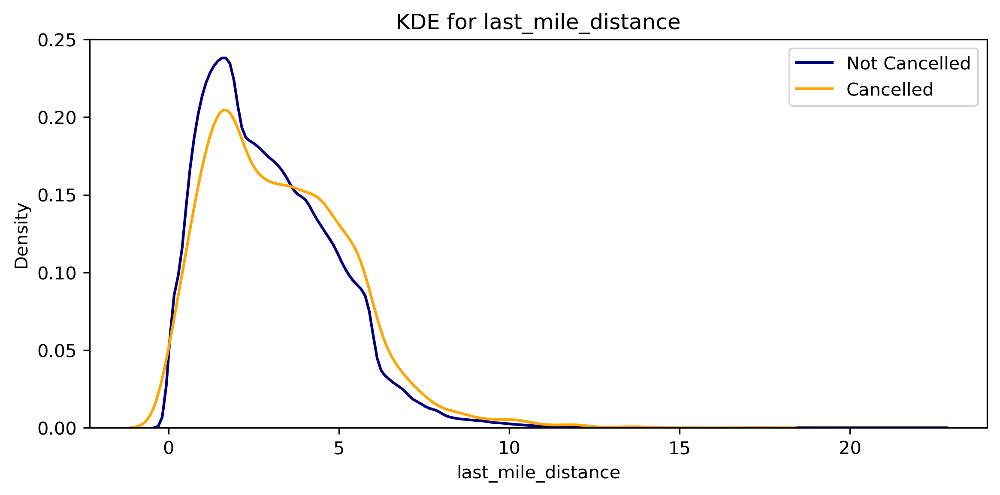

In [66]:
kdeplot('last_mile_distance')

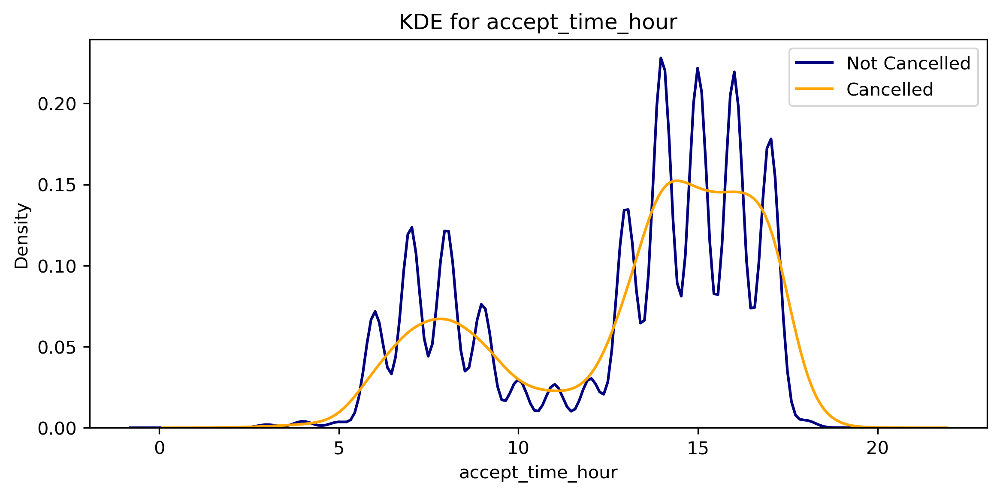

In [67]:
kdeplot('accept_time_hour')

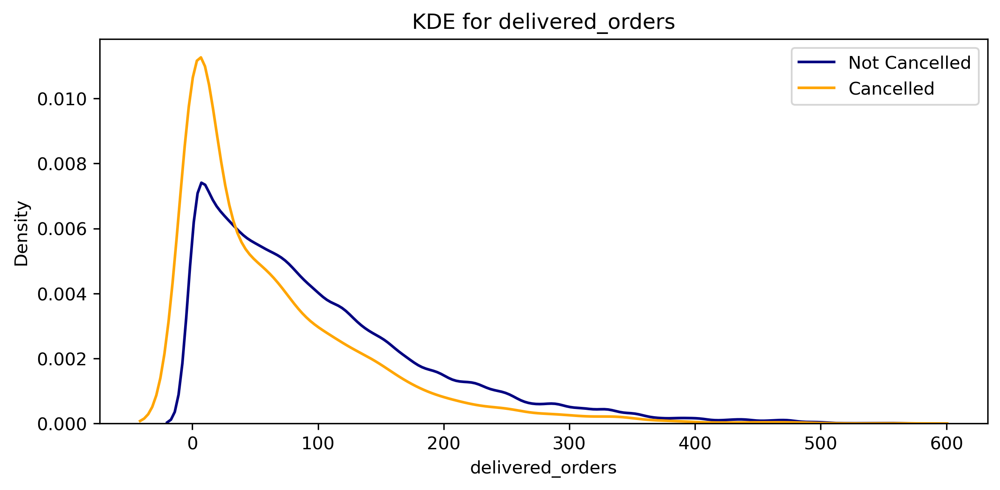

In [69]:
kdeplot('delivered_orders')

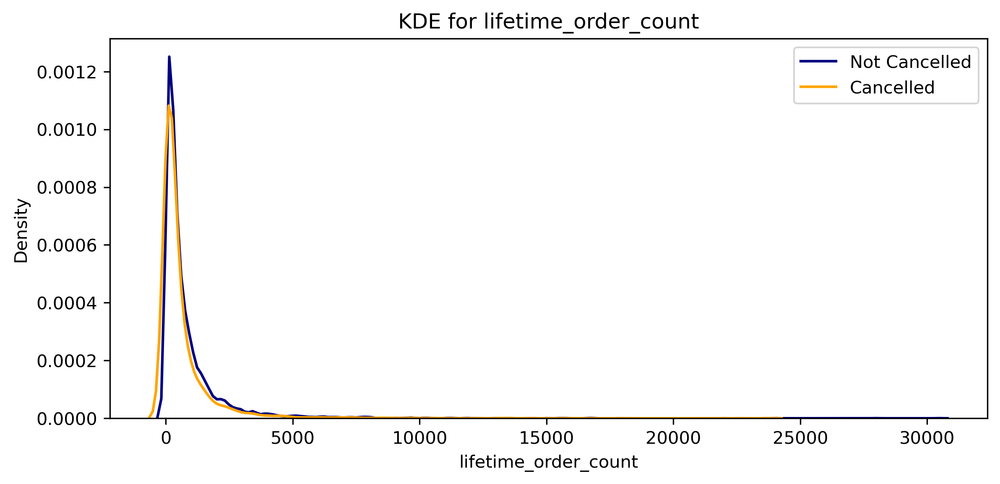

In [70]:
kdeplot('lifetime_order_count')

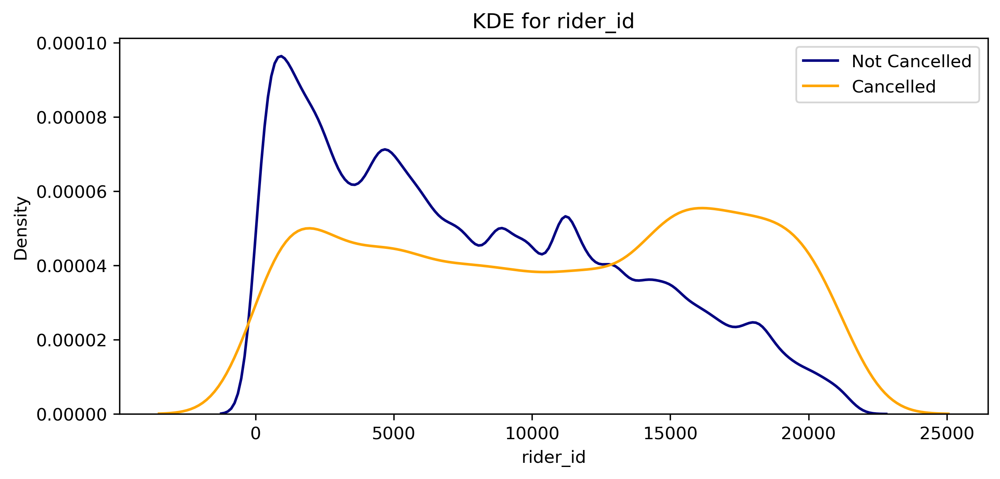

In [71]:
kdeplot('rider_id')

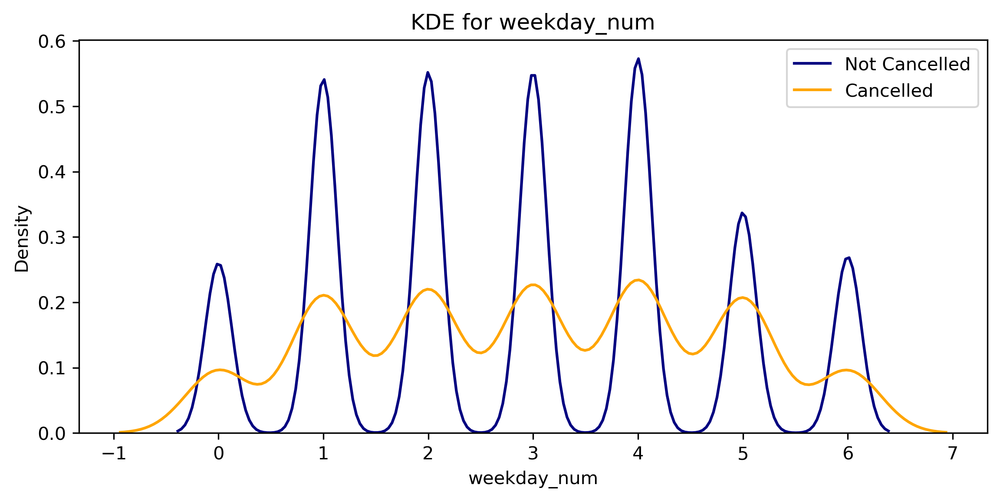

In [134]:
kdeplot('weekday_num')
#0 -> Monday
#6 -> Sunday

In [106]:
len(train[train.cancelled==0])

444782

In [126]:
def weekday_percent(row):
    if(row['cancelled']==1):
        return row['percent']/5218
    else:
        return row['percent']/444782

In [141]:
def barplot_percentages(feature, orient='v', axis_name="percent"):
    ratios = pd.DataFrame()
    g = train.groupby(feature)["cancelled"].value_counts().to_frame()
    g = g.rename({"cancelled": axis_name}, axis=1).reset_index()
    g[axis_name] = g[axis_name]/len(train)

    if orient == 'v':
        ax = sns.barplot(x=feature, y= axis_name, hue='cancelled', data=g, orient=orient)
        ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
    else:
        ax = sns.barplot(x= axis_name, y=feature, hue='cancelled', data=g, orient=orient)
        ax.set_xticklabels(['{:,.0%}'.format(x) for x in ax.get_xticks()])
#     plt.legend()
    ax.plot()
    

In [136]:
train.weekday.values

array(['Tuesday', 'Tuesday', 'Tuesday', ..., 'Saturday', 'Saturday',
       'Saturday'], dtype=object)

In [154]:
train.head()

,order_time,order_id,order_date,allot_time,accept_time,pickup_time,delivered_time,rider_id,first_mile_distance,last_mile_distance,...,total_dist,weekday,order_time_hour,accept_time_hour,first_order,cancel_before_accept,delivered_fraction,accept_order_diff,weekday_num,call_total
0,2021-01-26 02:21:35,556753,2021-01-26,2021-01-26 02:21:59,2021-01-26 02:22:08,2021-01-26 02:32:51,2021-01-26 02:49:47,11696,1.5666,2.65,...,4.2166,Tuesday,2,2.0,1,0,1.0,33.0,1,2.0
1,2021-01-26 02:33:16,556754,2021-01-26,2021-01-26 02:33:57,2021-01-26 02:34:45,2021-01-26 02:50:25,2021-01-26 03:11:15,18117,2.5207,2.76,...,5.2807,Tuesday,2,2.0,1,0,1.0,89.0,1,1.0
2,2021-01-26 02:39:49,556755,2021-01-26,2021-01-26 02:39:57,2021-01-26 02:40:13,2021-01-26 02:56:00,2021-01-26 03:12:46,18623,2.2074,4.80,...,7.0074,Tuesday,2,2.0,1,0,1.0,24.0,1,NaN
3,2021-01-26 02:47:53,556756,2021-01-26,2021-01-26 02:48:25,2021-01-26 02:49:06,2021-01-26 03:21:51,2021-01-26 03:41:05,15945,2.1894,6.38,...,8.5694,Tuesday,2,2.0,1,0,1.0,73.0,1,3.0
4,2021-01-26 03:06:30,556757,2021-01-26,2021-01-26 03:07:21,2021-01-26 03:07:57,2021-01-26 03:31:38,2021-01-26 04:00:15,17589,2.7870,4.01,...,6.7970,Tuesday,3,3.0,1,0,1.0,87.0,1,1.0


In [160]:
train[train.cancelled==0].call_total.describe()

count    287093.000000
mean          1.472394
std           1.132397
min           1.000000
25%           1.000000
50%           1.000000
75%           2.000000
max          67.000000
Name: call_total, dtype: float64

In [161]:
train[train.cancelled==1].call_total.describe()

count    3364.000000
mean        1.452438
std         1.115590
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max        29.000000
Name: call_total, dtype: float64

In [167]:
call_user_data = call.groupby('order_id')['user_type'].value_counts().to_frame()

In [169]:
call_user_data = call_user_data.rename({"user_type": 'number'}, axis=1).reset_index()

In [194]:
call_user_data.head()

,order_id,user_type,number
0,0,customer,1
1,0,support,1
2,1,customer,1
3,3,support,2
4,3,customer,1


In [229]:
def customer_calls(row):
    customer_calls = call_user_data[(call_user_data.order_id == row['order_id']) & (call_user_data.user_type =='customer')]['number']
    customer_calls = customer_calls.values
    if pd.isna(customer_calls):
        return 0
    return customer_calls

In [231]:
train.head()

,order_time,order_id,order_date,allot_time,accept_time,pickup_time,delivered_time,rider_id,first_mile_distance,last_mile_distance,...,order_time_hour,accept_time_hour,first_order,cancel_before_accept,delivered_fraction,accept_order_diff,weekday_num,call_total,call_support,call_customer
0,2021-01-26 02:21:35,556753,2021-01-26,2021-01-26 02:21:59,2021-01-26 02:22:08,2021-01-26 02:32:51,2021-01-26 02:49:47,11696,1.5666,2.65,...,2,2.0,1,0,1.0,33.0,1,2.0,NaN,1.0
1,2021-01-26 02:33:16,556754,2021-01-26,2021-01-26 02:33:57,2021-01-26 02:34:45,2021-01-26 02:50:25,2021-01-26 03:11:15,18117,2.5207,2.76,...,2,2.0,1,0,1.0,89.0,1,1.0,1.0,NaN
2,2021-01-26 02:39:49,556755,2021-01-26,2021-01-26 02:39:57,2021-01-26 02:40:13,2021-01-26 02:56:00,2021-01-26 03:12:46,18623,2.2074,4.80,...,2,2.0,1,0,1.0,24.0,1,NaN,NaN,1.0
3,2021-01-26 02:47:53,556756,2021-01-26,2021-01-26 02:48:25,2021-01-26 02:49:06,2021-01-26 03:21:51,2021-01-26 03:41:05,15945,2.1894,6.38,...,2,2.0,1,0,1.0,73.0,1,3.0,2.0,NaN
4,2021-01-26 03:06:30,556757,2021-01-26,2021-01-26 03:07:21,2021-01-26 03:07:57,2021-01-26 03:31:38,2021-01-26 04:00:15,17589,2.7870,4.01,...,3,3.0,1,0,1.0,87.0,1,1.0,NaN,1.0


In [181]:
call_support_df = call_user_data[call_user_data.user_type=='support']['number']

In [180]:
call_customer_df = call_user_data[call_user_data.user_type=='customer']['number']

In [184]:
call_support_df

1         1
3         2
15        5
17        8
29        2
         ..
397010    3
397027    1
397064    1
397066    1
397069    1
Name: number, Length: 18440, dtype: int64

In [185]:
call_train = pd.merge(left=train, right=call_user_data, left_on='order_id', right_on='order_id')

In [187]:
call_train.head()

,order_time,order_id,order_date,allot_time,accept_time,pickup_time,delivered_time,rider_id,first_mile_distance,last_mile_distance,...,first_order,cancel_before_accept,delivered_fraction,accept_order_diff,weekday_num,call_total,call_support,call_customer,user_type,number
0,2021-01-26 02:21:35,556753,2021-01-26,2021-01-26 02:21:59,2021-01-26 02:22:08,2021-01-26 02:32:51,2021-01-26 02:49:47,11696,1.5666,2.65,...,1,0,1.000000,33.0,1,2.0,NaN,1.0,customer,2
1,2021-01-26 02:33:16,556754,2021-01-26,2021-01-26 02:33:57,2021-01-26 02:34:45,2021-01-26 02:50:25,2021-01-26 03:11:15,18117,2.5207,2.76,...,1,0,1.000000,89.0,1,1.0,1.0,NaN,customer,1
2,2021-01-26 02:39:49,556755,2021-01-26,2021-01-26 02:39:57,2021-01-26 02:40:13,2021-01-26 02:56:00,2021-01-26 03:12:46,18623,2.2074,4.80,...,1,0,1.000000,24.0,1,NaN,NaN,1.0,customer,2
3,2021-01-26 03:06:30,556757,2021-01-26,2021-01-26 03:07:21,2021-01-26 03:07:57,2021-01-26 03:31:38,2021-01-26 04:00:15,17589,2.7870,4.01,...,1,0,1.000000,87.0,1,1.0,NaN,1.0,customer,1
4,2021-01-26 03:07:16,556758,2021-01-26,2021-01-26 03:12:14,2021-01-26 03:12:27,2021-01-26 03:25:36,2021-01-26 03:45:51,1469,2.4818,5.18,...,1,0,0.993243,311.0,1,1.0,NaN,1.0,customer,1


In [190]:
def callkdeplot(feature):
    plt.figure(figsize=(9, 4))
    plt.title("KDE for {}".format(feature))
    ax0 = sns.kdeplot(call_train[call_train['cancelled'] == 0][feature].dropna(), color= 'navy', label= 'Not Cancelled')
    ax1 = sns.kdeplot(call_train[call_train['cancelled'] == 1][feature].dropna(), color= 'orange', label= 'Cancelled')
    plt.legend()

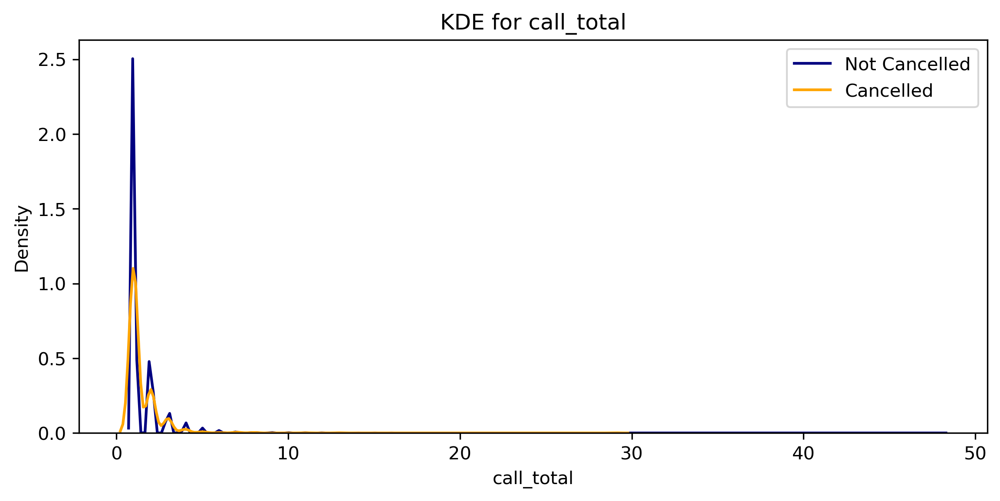

In [191]:
callkdeplot('call_total')

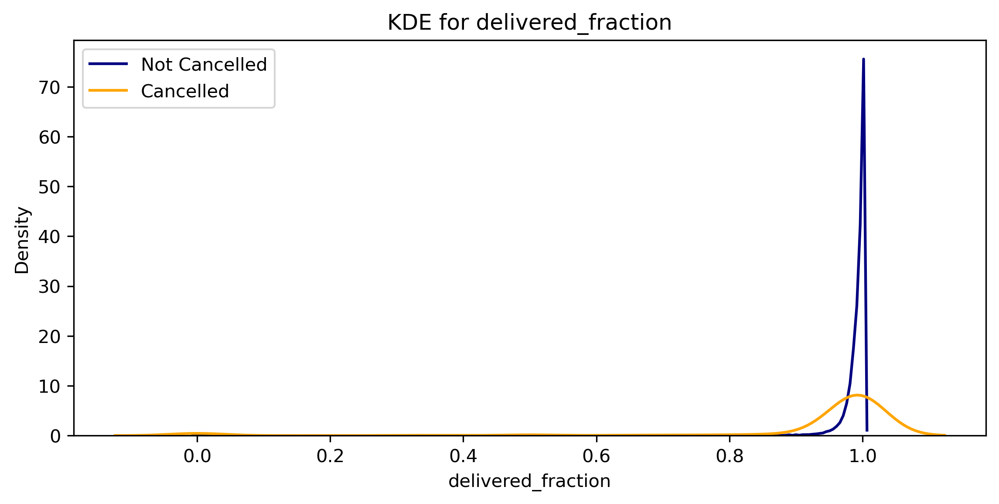

In [193]:
kdeplot('delivered_fraction')

In [ ]:
train2 = train.drop(['call_support', 'call_customer'])

In [234]:
px.imshow(train.corr())

In [233]:
train.reassigned_order = train['reassigned_order'].fillna(value = 0)

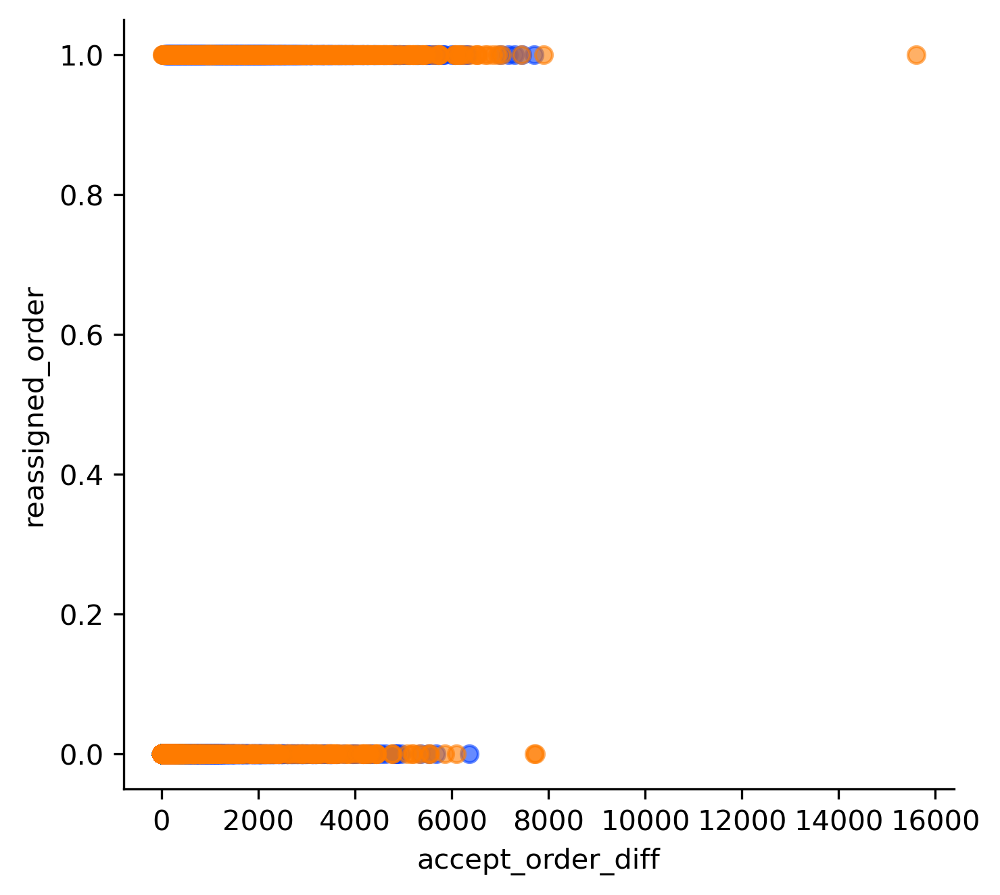

In [236]:
g = sns.PairGrid(train, y_vars=["reassigned_order"], x_vars=["accept_order_diff"], height=4.5, hue="cancelled", aspect=1.1)
ax = g.map(plt.scatter, alpha=0.6)

In [237]:
train.columns

Index(['order_time', 'order_id', 'order_date', 'allot_time', 'accept_time',
       'pickup_time', 'delivered_time', 'rider_id', 'first_mile_distance',
       'last_mile_distance', 'alloted_orders', 'delivered_orders', 'cancelled',
       'undelivered_orders', 'lifetime_order_count', 'reassignment_method',
       'reassignment_reason', 'reassigned_order', 'session_time',
       'cancelled_time', 'total_dist', 'weekday', 'order_time_hour',
       'accept_time_hour', 'first_order', 'cancel_before_accept',
       'delivered_fraction', 'accept_order_diff', 'weekday_num', 'call_total',
       'call_support', 'call_customer'],
      dtype='object')

In [254]:
drop = [ 'pickup_time', 'delivered_time', 'cancelled_time',  'weekday', 'allot_time', 'accept_time','reassignment_method',
       'reassignment_reason','order_date', 'order_time', 'order_id', 'rider_id', 'call_support', 'call_customer', 'accept_time_hour']
train2 = train.drop(drop, axis=1)
train2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 450000 entries, 0 to 449999
Data columns (total 17 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   first_mile_distance   450000 non-null  float64
 1   last_mile_distance    450000 non-null  float64
 2   alloted_orders        450000 non-null  float64
 3   delivered_orders      450000 non-null  float64
 4   cancelled             450000 non-null  int64  
 5   undelivered_orders    450000 non-null  float64
 6   lifetime_order_count  450000 non-null  float64
 7   reassigned_order      450000 non-null  float64
 8   session_time          450000 non-null  float64
 9   total_dist            450000 non-null  float64
 10  order_time_hour       450000 non-null  int64  
 11  first_order           450000 non-null  int64  
 12  cancel_before_accept  450000 non-null  int64  
 13  delivered_fraction    433052 non-null  float64
 14  accept_order_diff     449843 non-null  float64
 15  

In [256]:
train2 = train2.fillna(0)

In [257]:
from sklearn.ensemble import RandomForestClassifier
params = {'random_state': 0, 'n_jobs': 4, 'n_estimators': 5000, 'max_depth': 8}
# One-hot encode
#df = pd.get_dummies(train)
#print(df.columns)
# Drop redundant columns (for features with two unique values)

x = train2.drop(['cancelled'],axis=1).values
y = train2.cancelled.values
# Fit RandomForest Classifier
clf = RandomForestClassifier(**params)
clf = clf.fit(x, y)
# Plot features importances
imp = pd.Series(data=clf.feature_importances_, index=x.columns).sort_values(ascending=False)
plt.figure(figsize=(10,12))
plt.title("Feature importance")
ax = sns.barplot(y=imp.index, x=imp.values, palette="Blues_d", orient='h')

KeyboardInterrupt: 

In [301]:
delivered_df = train[train.delivered_time.isna()==False]

In [302]:
delivered_df.head()

,order_time,order_id,order_date,allot_time,accept_time,pickup_time,delivered_time,rider_id,first_mile_distance,last_mile_distance,...,order_time_hour,accept_time_hour,first_order,cancel_before_accept,delivered_fraction,accept_order_diff,weekday_num,call_total,call_support,call_customer
0,2021-01-26 02:21:35,556753,2021-01-26,2021-01-26 02:21:59,2021-01-26 02:22:08,2021-01-26 02:32:51,2021-01-26 02:49:47,11696,1.5666,2.65,...,2,2.0,1,0,1.0,33.0,1,2.0,NaN,1.0
1,2021-01-26 02:33:16,556754,2021-01-26,2021-01-26 02:33:57,2021-01-26 02:34:45,2021-01-26 02:50:25,2021-01-26 03:11:15,18117,2.5207,2.76,...,2,2.0,1,0,1.0,89.0,1,1.0,1.0,NaN
2,2021-01-26 02:39:49,556755,2021-01-26,2021-01-26 02:39:57,2021-01-26 02:40:13,2021-01-26 02:56:00,2021-01-26 03:12:46,18623,2.2074,4.80,...,2,2.0,1,0,1.0,24.0,1,NaN,NaN,1.0
3,2021-01-26 02:47:53,556756,2021-01-26,2021-01-26 02:48:25,2021-01-26 02:49:06,2021-01-26 03:21:51,2021-01-26 03:41:05,15945,2.1894,6.38,...,2,2.0,1,0,1.0,73.0,1,3.0,2.0,NaN
4,2021-01-26 03:06:30,556757,2021-01-26,2021-01-26 03:07:21,2021-01-26 03:07:57,2021-01-26 03:31:38,2021-01-26 04:00:15,17589,2.7870,4.01,...,3,3.0,1,0,1.0,87.0,1,1.0,NaN,1.0


In [315]:
delivered_df['delivery_time'] = (delivered_df.delivered_time - delivered_df.pickup_time).dt.total_seconds()/60

In [316]:
delivered_df.delivery_time.describe()

count    444782.000000
mean         16.294790
std          43.244879
min           0.050000
25%           9.516667
50%          13.650000
75%          19.150000
max       10009.016667
Name: delivery_time, dtype: float64

<AxesSubplot:xlabel='delivery_time', ylabel='Density'>

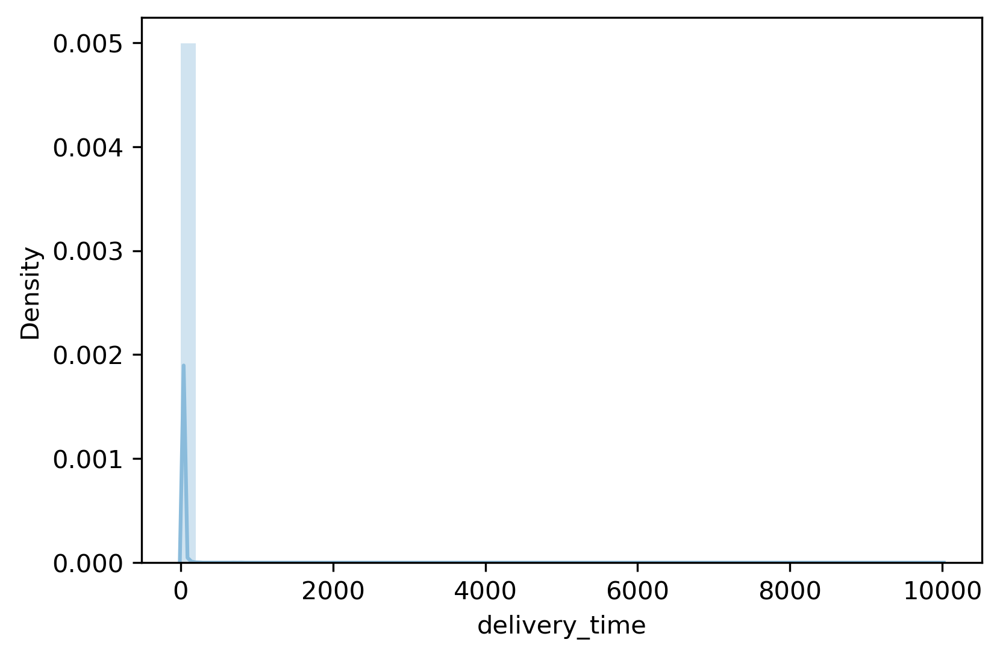

In [317]:
sns.distplot(delivered_df.delivery_time)

In [325]:
!pip install pandas_profiling

     |████████████████████████████████| 261 kB 1.2 MB/s eta 0:00:01
     |████████████████████████████████| 3.1 MB 19.7 MB/s eta 0:00:01
     |████████████████████████████████| 102 kB 23.8 MB/s ta 0:00:01
     |████████████████████████████████| 676 kB 32.6 MB/s eta 0:00:01
     |████████████████████████████████| 812 kB 29.7 MB/s eta 0:00:01
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27084 sha256=4acd70db77bd5829735613363195f2cf358e1ebcca954a4ebe17318285204a60
  Stored in directory: /home/gunjan/.cache/pip/wheels/23/14/6e/4be5bfeeb027f4939a01764b48edd5996acf574b0913fe5243
  Created wheel for imagehash: filename=ImageHash-4.2.1-py2.py3-none-any.whl size=295199 sha256=c63f89a4328ff524152c24edd8acc0af22f66ae4a4ee479797b8779e68d01028
  Stored in directory: /home/gunjan/.cache/pip/wheels/48/a1/7f/096c1269d6bf78d4768180602579b35a1e8cb1250bb4b40c74
Successfully built htmlmin imagehash
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe

In [338]:
train2 = train.drop(['call_support', 'call_customer'], axis=1)

In [ ]:
import pandas_profiling
df2 = pandas_profiling.ProfileReport(train2)
df2.to_file(output_file="train2.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]